# 1. Requirement

In [ ]:
from multiprocessing import cpu_count
from google.colab import drive
from os.path import join
from os.path import exists
drive.mount('/content/drive')

# Directories
working_directory_path = '/content/drive/My Drive/Project'
assets_directory = join(working_directory_path, "Assets")
preprocessed_directory = join(working_directory_path, "Preprocessed")
imputed_directory = join(working_directory_path, "Imputed")
h5ad_directory = join(working_directory_path, "H5AD")

# Config Files
file_uniprot2taxid_json = join(assets_directory, "uniprot2taxid.json")
file_taxid2ranks_json = join(assets_directory, "taxid2ranks.json")

print(exists(assets_directory))
print(exists(preprocessed_directory))
print(exists(h5ad_directory))
print(exists(imputed_directory))
print("CPU:", cpu_count())

Mounted at /content/drive
True
True
True
True
CPU: 2


In [ ]:
!pip install scanpy anndata

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 34.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.1/169.1 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.2/58.2 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 255.4/255.4 kB 19.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.8/8.8 MB 101.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.7/53.7 kB 3.8 MB/s eta 0:00:00


In [ ]:
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score, silhouette_score
import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc
import numpy as np

# 2. File Paths

In [ ]:
# AE
file_AE_train_imputed_h5ad = join(h5ad_directory, "AETrain.h5ad")
file_AE_test_imputed_h5ad = join(h5ad_directory, "AETest.h5ad")

# VAE
file_VAE_train_imputed_h5ad = join(h5ad_directory, "VAETrain.h5ad")
file_VAE_test_imputed_h5ad = join(h5ad_directory, "VAETest.h5ad")

# DAE
file_DAE_train_imputed_h5ad = join(h5ad_directory, "DAETrain.h5ad")
file_DAE_test_imputed_h5ad = join(h5ad_directory, "DAETest.h5ad")

# CFT
file_CFT_train_imputed_h5ad = join(h5ad_directory, "CFTTrain.h5ad")
file_CFT_test_imputed_h5ad = join(h5ad_directory, "CFTTest.h5ad")

# EM
# file_EM_train_imputed_h5ad = join(h5ad_directory, "EMTrain.h5ad")
# file_EM_test_imputed_h5ad = join(h5ad_directory, "EMTest.h5ad")

# KNN
file_KNN_train_imputed_h5ad = join(h5ad_directory, "KNNTrain.h5ad")
file_KNN_test_imputed_h5ad = join(h5ad_directory, "KNNTest.h5ad")

# SVD
file_SVD_train_imputed_h5ad = join(h5ad_directory, "SVDTrain.h5ad")
file_SVD_test_imputed_h5ad = join(h5ad_directory, "SVDTest.h5ad")

# MLE
file_MLE_train_imputed_h5ad = join(h5ad_directory, "MLETrain.h5ad")
file_MLE_test_imputed_h5ad = join(h5ad_directory, "MLETest.h5ad")

# LC (LeftCensored)
file_LC_train_imputed_h5ad = join(h5ad_directory, "LCTrain.h5ad")
file_LC_test_imputed_h5ad = join(h5ad_directory, "LCTest.h5ad")

# BPCA
file_BPCA_train_imputed_h5ad = join(h5ad_directory, "BPCATrain.h5ad")
file_BPCA_test_imputed_h5ad = join(h5ad_directory, "BPCATest.h5ad")


file_paths = [
    ("AE", file_AE_train_imputed_h5ad, file_AE_test_imputed_h5ad),
    ("VAE", file_VAE_train_imputed_h5ad, file_VAE_test_imputed_h5ad),
    ("DAE", file_DAE_train_imputed_h5ad, file_DAE_test_imputed_h5ad),
    ("CFT", file_CFT_train_imputed_h5ad, file_CFT_test_imputed_h5ad),
    # ("EM", file_EM_train_imputed_h5ad, file_EM_test_imputed_h5ad),
    ("KNN", file_KNN_train_imputed_h5ad, file_KNN_test_imputed_h5ad),
    ("SVD", file_SVD_train_imputed_h5ad, file_SVD_test_imputed_h5ad),
    ("MLE", file_MLE_train_imputed_h5ad, file_MLE_test_imputed_h5ad),
    ("LC", file_LC_train_imputed_h5ad, file_LC_test_imputed_h5ad),
    ("BPCA", file_BPCA_train_imputed_h5ad, file_BPCA_test_imputed_h5ad),
]
for label, train_h5ad, test_h5ad in file_paths:
  print(label, exists(train_h5ad), exists(test_h5ad))
  _adata_train = sc.read_h5ad(train_h5ad)
  _adata_test = sc.read_h5ad(test_h5ad)
  print(_adata_train)
  print(_adata_test)
  print("="*50)

AE True True
AnnData object with n_obs × n_vars = 775 × 240
    obs: 'taxid', 'root', 'domain', 'kingdom', 'phylum', 'class', 'order', 'family', 'genus', 'species', 'strain'
    var: 'label'
AnnData object with n_obs × n_vars = 775 × 120
    obs: 'taxid', 'root', 'domain', 'kingdom', 'phylum', 'class', 'order', 'family', 'genus', 'species', 'strain'
    var: 'label'
VAE True True
AnnData object with n_obs × n_vars = 775 × 240
    obs: 'taxid', 'root', 'domain', 'kingdom', 'phylum', 'class', 'order', 'family', 'genus', 'species', 'strain'
    var: 'label'
AnnData object with n_obs × n_vars = 775 × 120
    obs: 'taxid', 'root', 'domain', 'kingdom', 'phylum', 'class', 'order', 'family', 'genus', 'species', 'strain'
    var: 'label'
DAE True True
AnnData object with n_obs × n_vars = 775 × 240
    obs: 'taxid', 'root', 'domain', 'kingdom', 'phylum', 'class', 'order', 'family', 'genus', 'species', 'strain'
    var: 'label'
AnnData object with n_obs × n_vars = 775 × 120
    obs: 'taxid', 'roo

# 3. Check H5AD Files

## 3.1 PCA Variance Ratio

AE Train - PCA Variance Ratio:


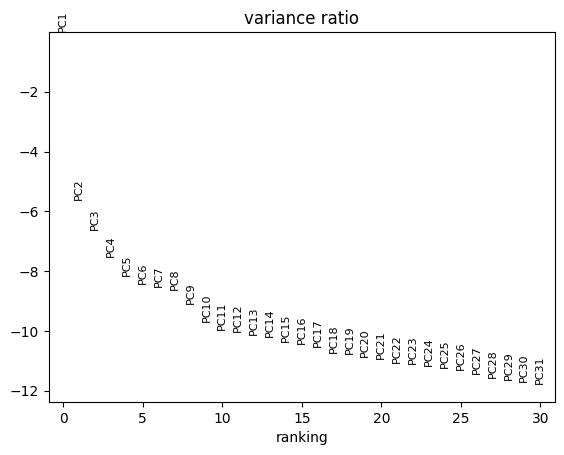

AE Test - PCA Variance Ratio:


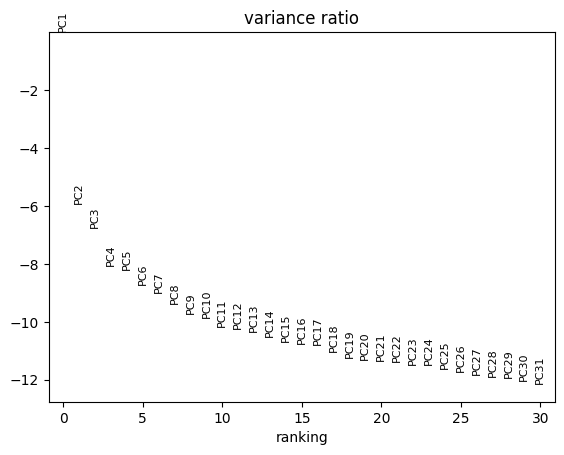

VAE Train - PCA Variance Ratio:


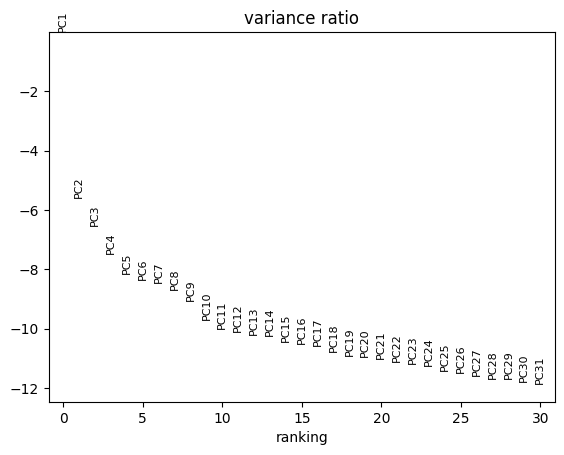

VAE Test - PCA Variance Ratio:


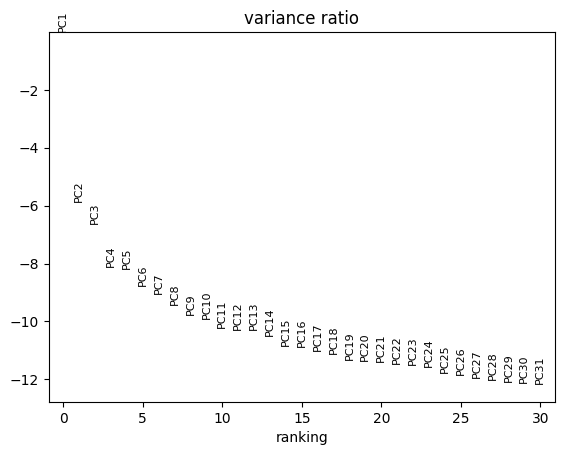

DAE Train - PCA Variance Ratio:


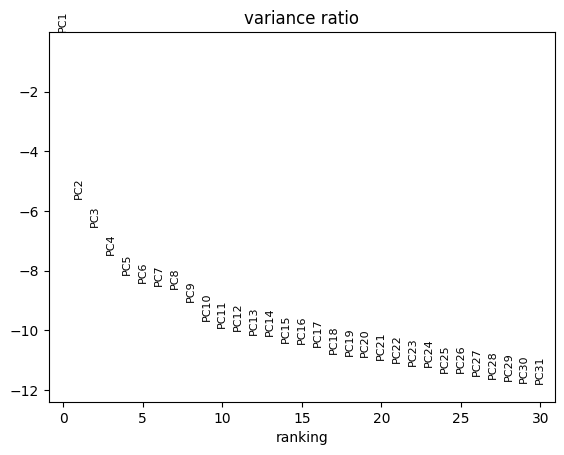

DAE Test - PCA Variance Ratio:


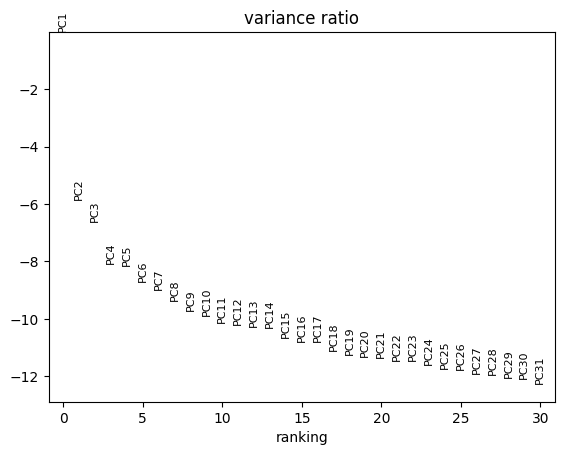

CFT Train - PCA Variance Ratio:


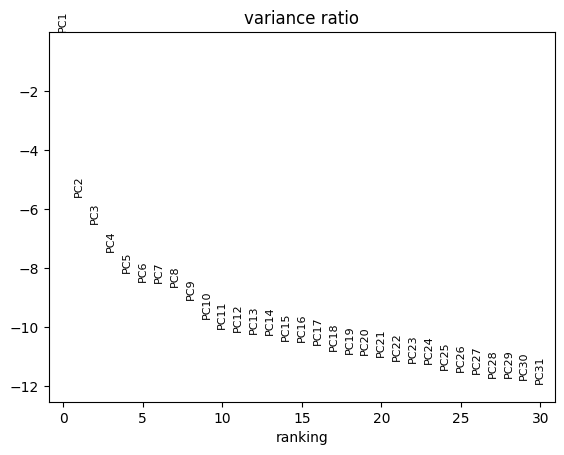

CFT Test - PCA Variance Ratio:


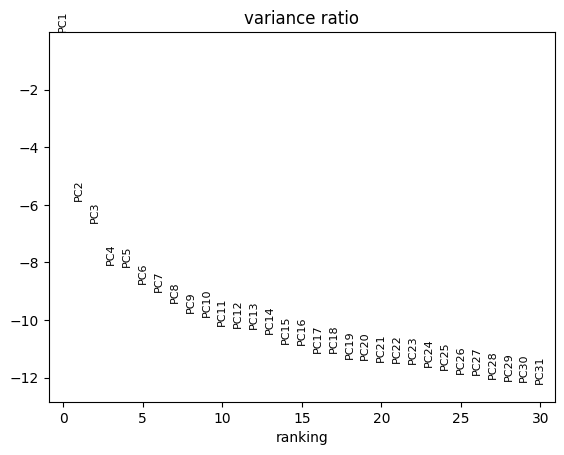

KNN Train - PCA Variance Ratio:


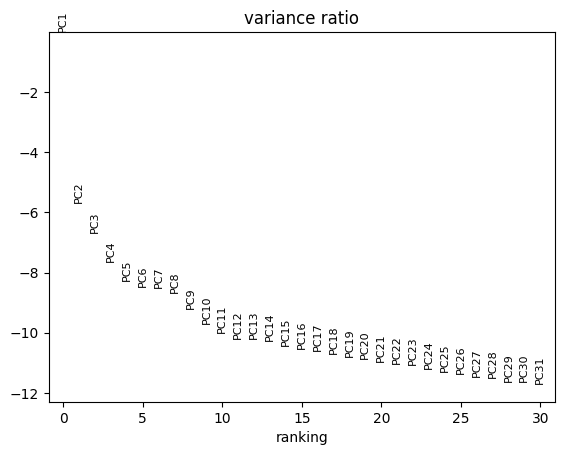

KNN Test - PCA Variance Ratio:


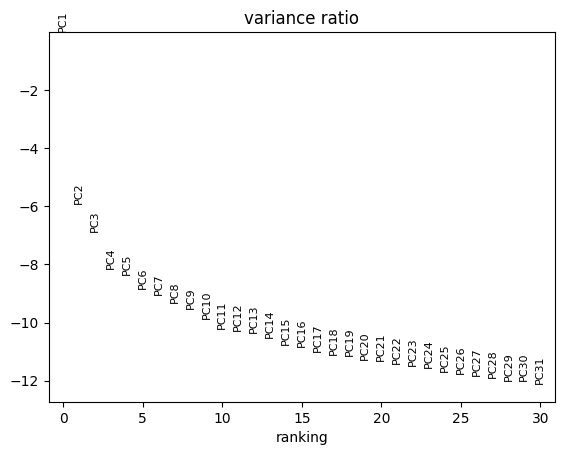

SVD Train - PCA Variance Ratio:


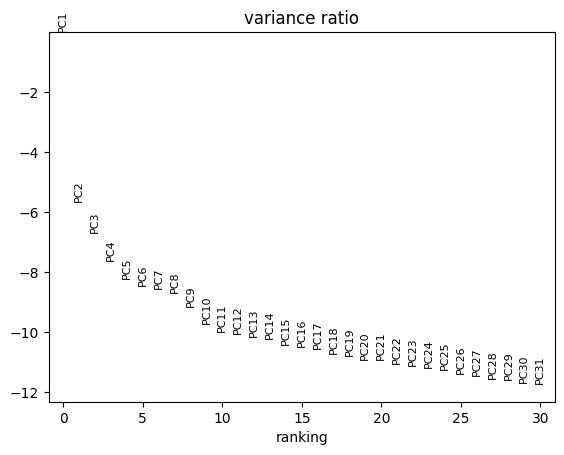

SVD Test - PCA Variance Ratio:


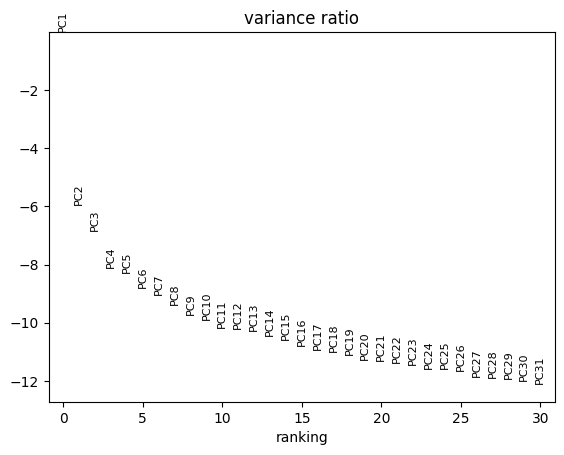

MLE Train - PCA Variance Ratio:


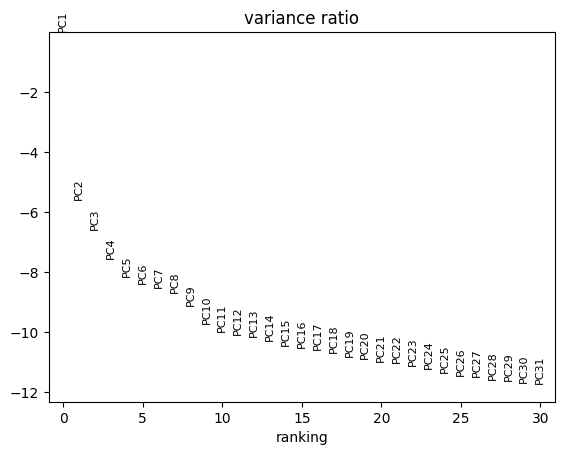

MLE Test - PCA Variance Ratio:


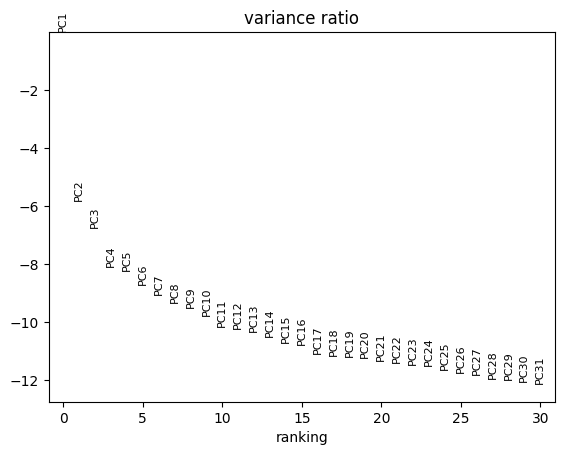

LC Train - PCA Variance Ratio:


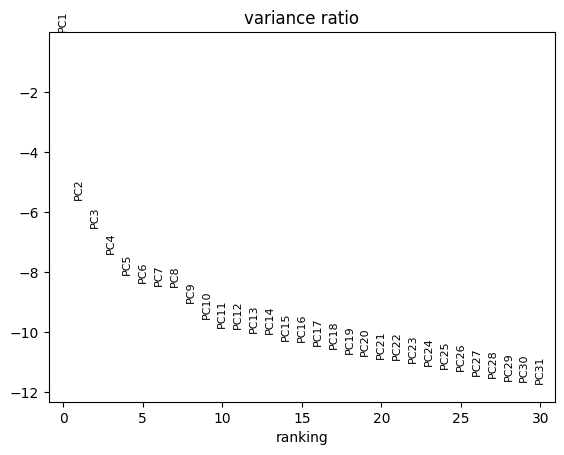

LC Test - PCA Variance Ratio:


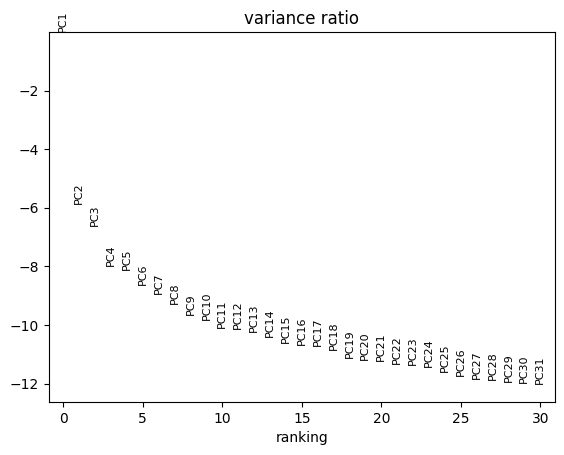

BPCA Train - PCA Variance Ratio:


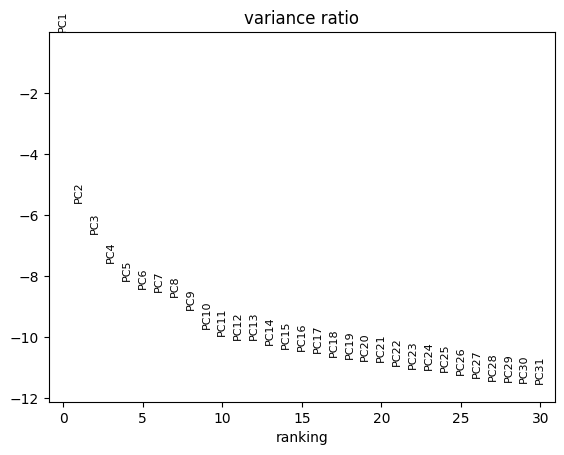

BPCA Test - PCA Variance Ratio:


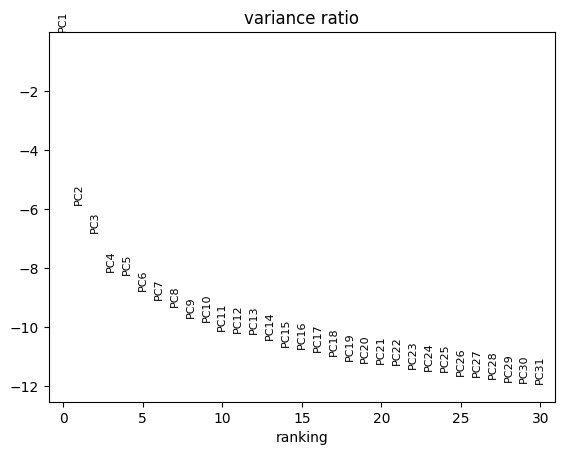

In [ ]:
for label, train_h5ad, test_h5ad in file_paths:
  _adata_train = sc.read_h5ad(train_h5ad)
  _adata_test = sc.read_h5ad(test_h5ad)
  print(f"{label} Train - PCA Variance Ratio:")
  sc.tl.pca(_adata_train, svd_solver='arpack', n_comps=100)
  sc.pl.pca_variance_ratio(_adata_train, log=True)
  print(f"{label} Test - PCA Variance Ratio:")
  sc.tl.pca(_adata_test, svd_solver='arpack', n_comps=100)
  sc.pl.pca_variance_ratio(_adata_test, log=True)
  print("="*100)

## 3.2 Color by Family

In [ ]:
for label, train_h5ad, test_h5ad in file_paths:
  _adata_train = sc.read_h5ad(train_h5ad)
  _adata_test = sc.read_h5ad(test_h5ad)
  print(f"{label} Train - Colored by Family:")
  sc.pp.neighbors(_adata_train, n_neighbors=50, n_pcs=11)
  sc.tl.umap(_adata_train)
  sc.pl.umap(_adata_train, color='family', na_color='lightgrey', size=50, title=f"{label} - UMAP by Family (Train)", legend_loc='right margin')
  plt.show()
  print(f"{label} Test - Colored by Family:")
  sc.pp.neighbors(_adata_test, n_neighbors=50, n_pcs=11)
  sc.tl.umap(_adata_test)
  sc.pl.umap(_adata_test, color='family', na_color='lightgrey', size=50, title=f"{label} - UMAP by Family (Test)", legend_loc='right margin')
  plt.show()
  print("="*100)

Output hidden; open in https://colab.research.google.com to view.

## 3.3 Clusters Membership

In [ ]:
def analyze_h5ad_taxonomic_clusters(h5ad_path: str):
    """
    Reads an .h5ad file and prints, for each taxonomic rank:
      1. Number of clusters (including Na)
      2. Whether it has a Na cluster
      3. Members count of each cluster
      4. Average number of members per cluster

    :param h5ad_path: Path to the .h5ad file
    """
    adata = sc.read_h5ad(h5ad_path)
    ranks = ['kingdom', 'phylum', 'class', 'order', 'family', 'genus', 'species', 'strain']

    for rank in ranks:
        col = adata.obs[rank]
        counts = col.value_counts(dropna=False)
        n_clusters = counts.shape[0]
        has_na = col.isna().any()
        avg_members = counts.mean()

        print(f"\nRank: {rank}")
        print(f"  1. Number of clusters (including Na): {n_clusters}")
        print(f"  2. Contains Na cluster: {has_na}")
        print(f"  4. Average members per cluster: {avg_members:.2f}")
        print(f"  3. Members per cluster:")
        for cluster_label, count in counts.items():
            label = 'Na' if pd.isna(cluster_label) else str(cluster_label)
            print(f"    - {label}: {count} members")


# ALL Files
# for label, train_h5ad, test_h5ad in file_paths:
#   print(f"{label} Train:")
#   analyze_h5ad_taxonomic_clusters(train_h5ad)
#   print(f"{label} Test:")
#   analyze_h5ad_taxonomic_clusters(test_h5ad)

# obs: 'taxid', 'root', 'domain', 'kingdom', 'phylum', 'class', 'order', 'family', 'genus', 'species', 'strain'


print(f"{label} - VAE - Train:")
analyze_h5ad_taxonomic_clusters(file_VAE_train_imputed_h5ad)
print(f"{label} - VAE - Test:")
analyze_h5ad_taxonomic_clusters(file_VAE_test_imputed_h5ad)

BPCA - VAE - Train:

Rank: kingdom
  1. Number of clusters (including Na): 6
  2. Contains Na cluster: True
  4. Average members per cluster: 129.17
  3. Members per cluster:
    - Pseudomonadati: 389 members
    - Bacillati: 316 members
    - Fusobacteriati: 56 members
    - Na: 11 members
    - Heunggongvirae: 2 members
    - Metazoa: 1 members

Rank: phylum
  1. Number of clusters (including Na): 16
  2. Contains Na cluster: True
  4. Average members per cluster: 48.44
  3. Members per cluster:
    - Bacillota: 235 members
    - Pseudomonadota: 190 members
    - Bacteroidota: 174 members
    - Actinomycetota: 79 members
    - Fusobacteriota: 56 members
    - Campylobacterota: 15 members
    - Spirochaetota: 9 members
    - Candidatus Saccharimonadota: 6 members
    - Candidatus Absconditibacteriota: 2 members
    - Candidatus Altimarinota: 2 members
    - Uroviricota: 2 members
    - Verrucomicrobiota: 1 members
    - Cyanobacteriota: 1 members
    - Mycoplasmatota: 1 members
    - 

## 3.4 Color by More Ranks


▶ Processing AE_train: /content/drive/My Drive/Project/H5AD/AETrain.h5ad


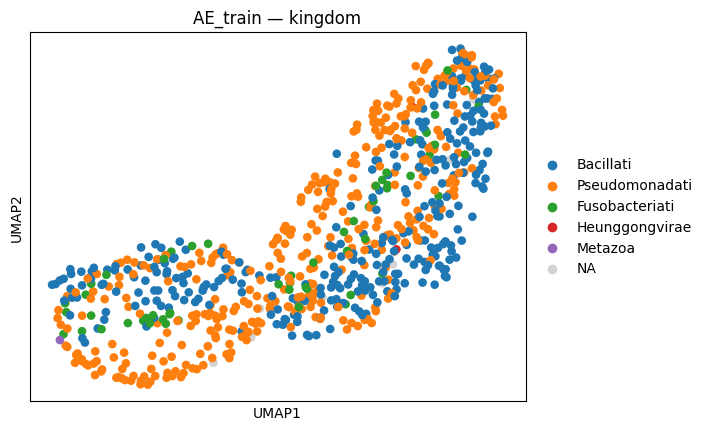

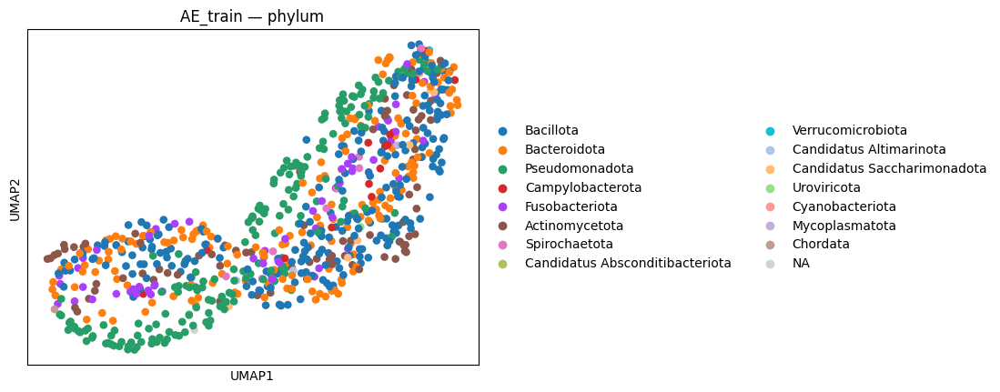

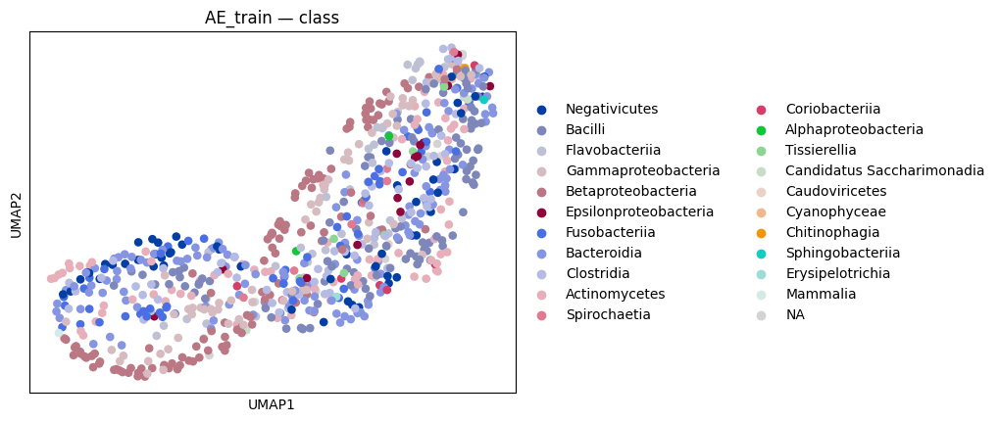

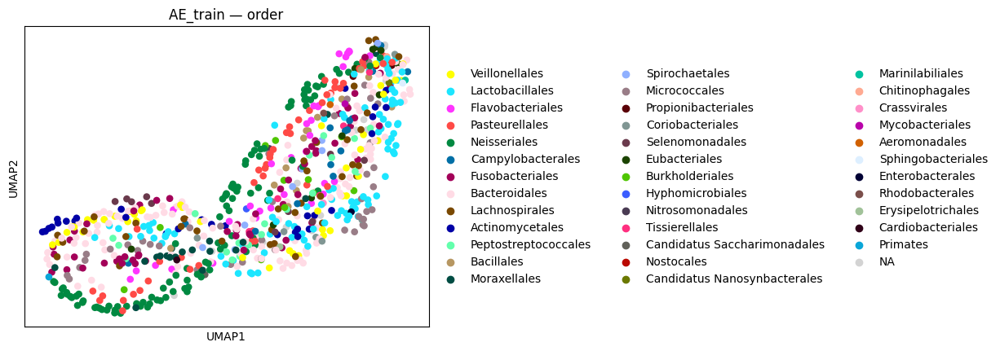

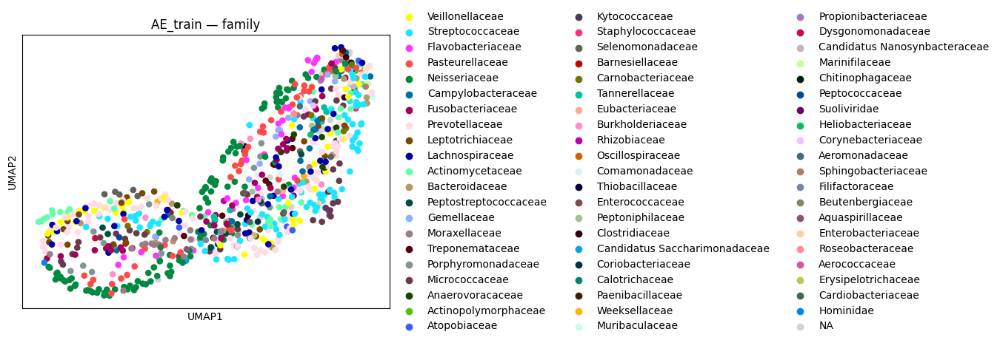


▶ Processing AE_test: /content/drive/My Drive/Project/H5AD/AETest.h5ad


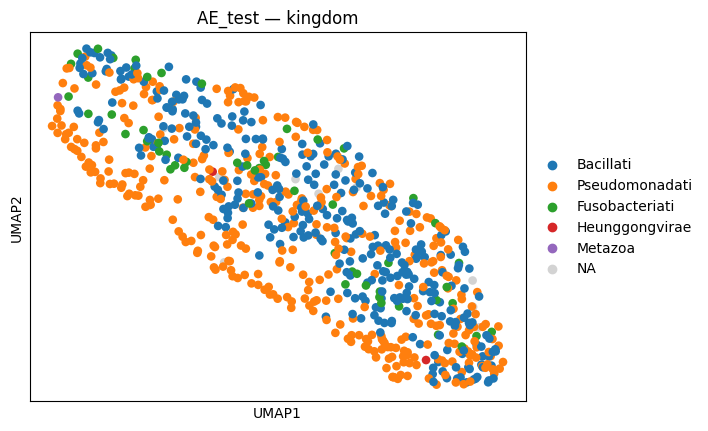

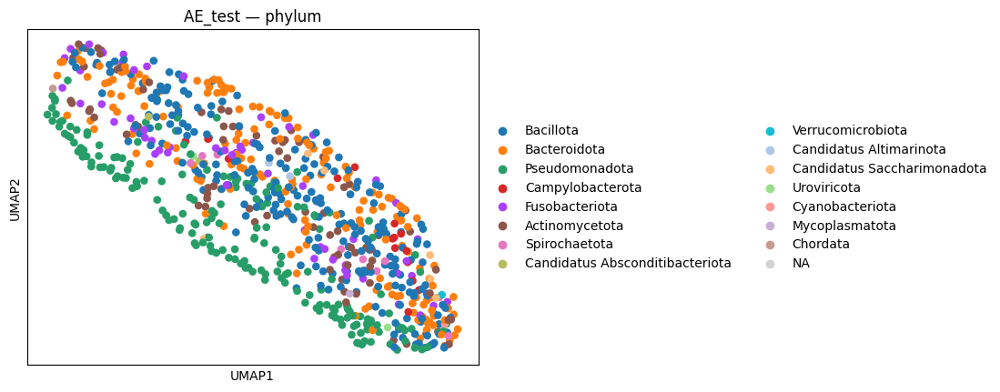

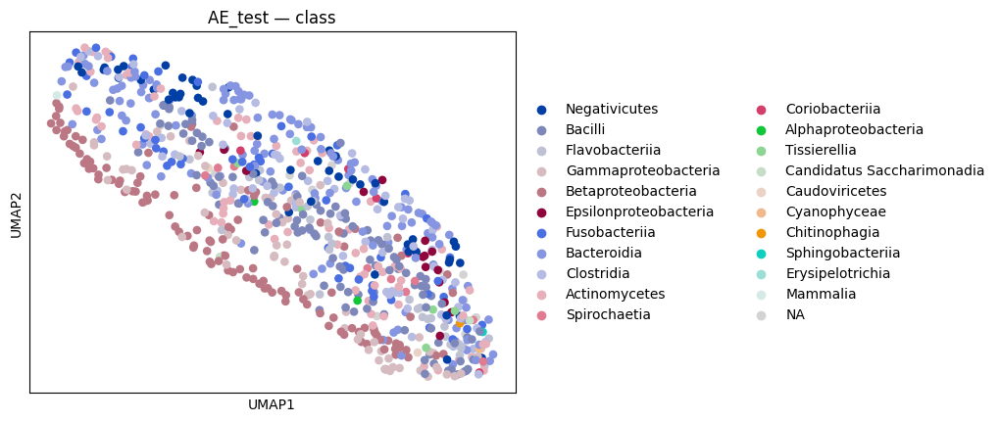

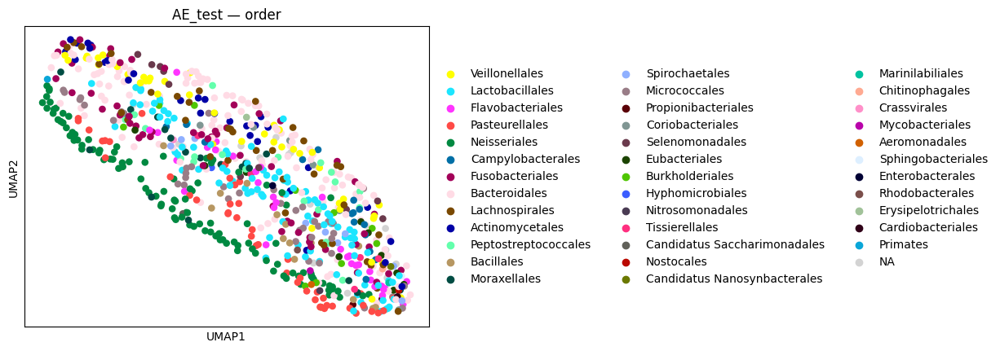

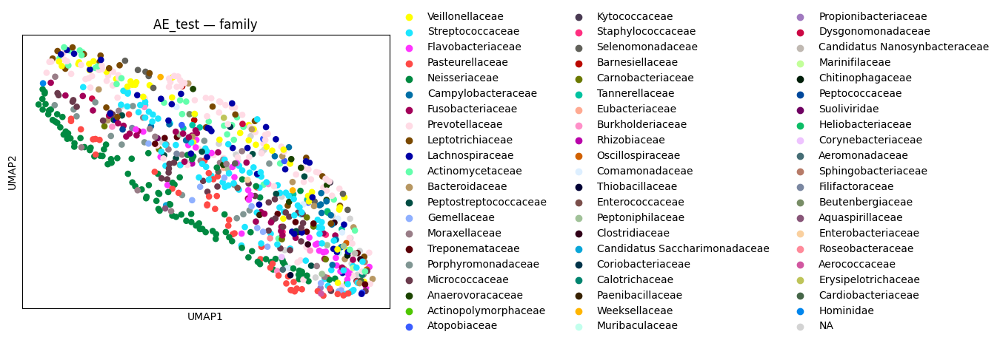


▶ Processing VAE_train: /content/drive/My Drive/Project/H5AD/VAETrain.h5ad


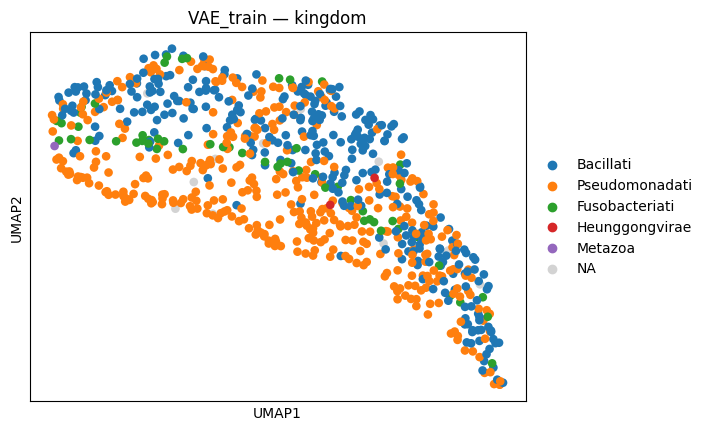

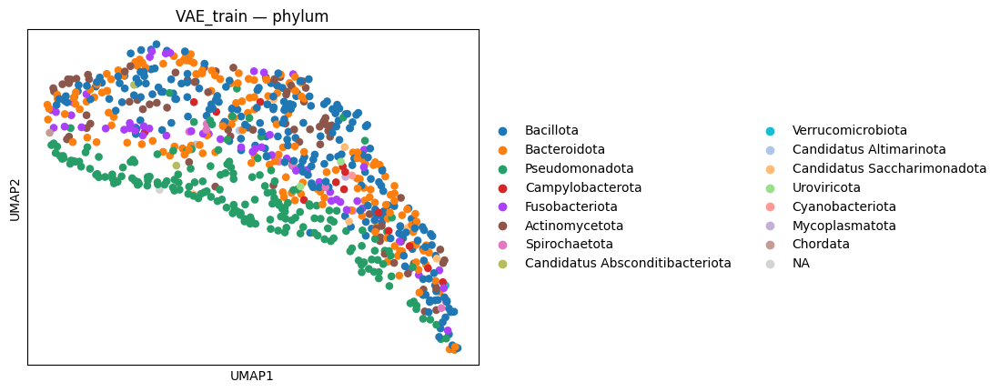

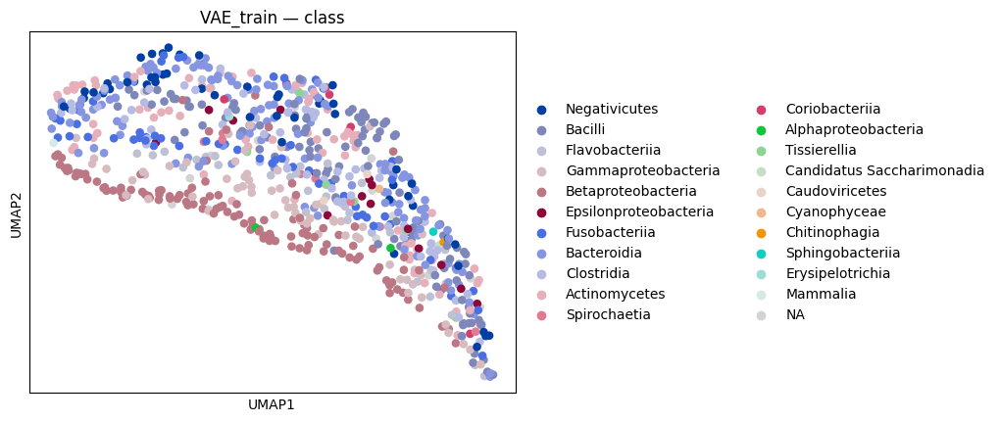

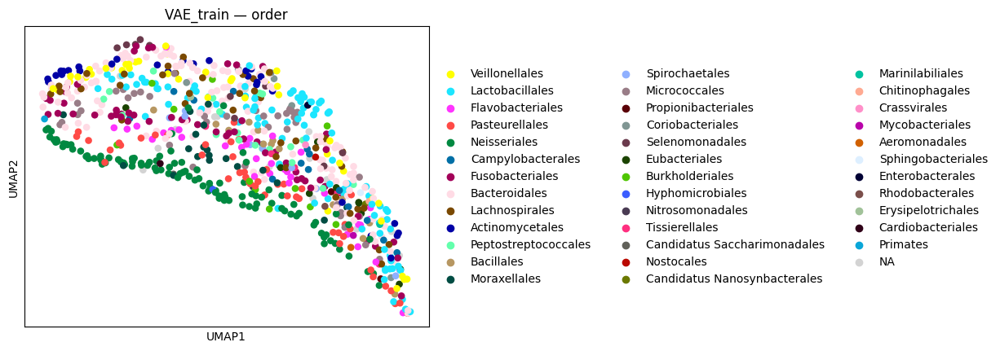

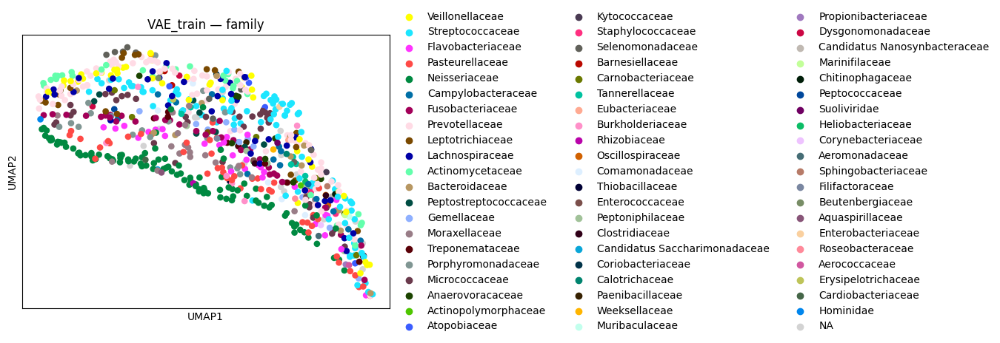


▶ Processing VAE_test: /content/drive/My Drive/Project/H5AD/VAETest.h5ad


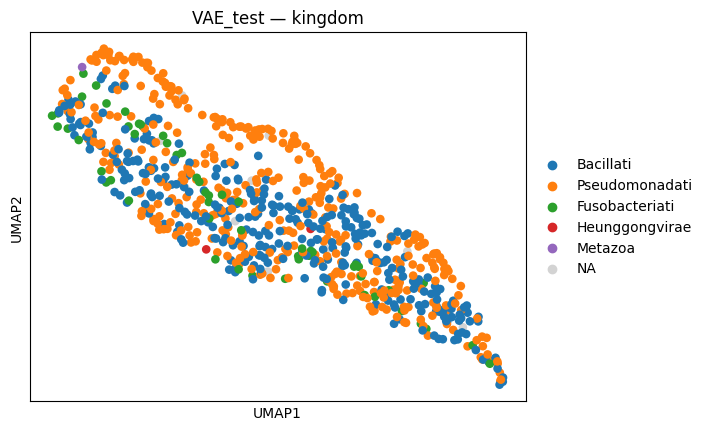

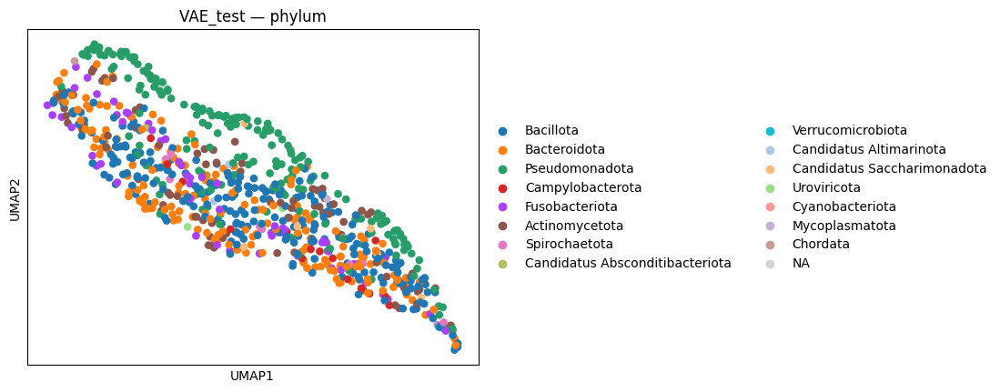

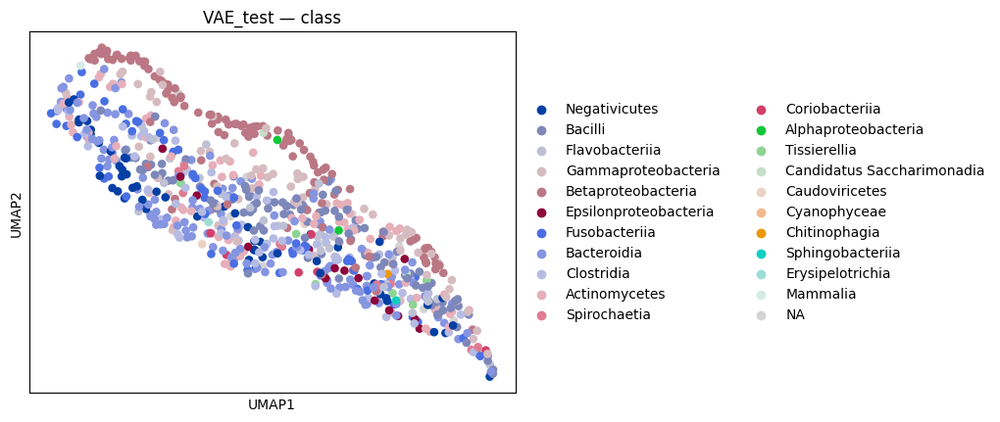

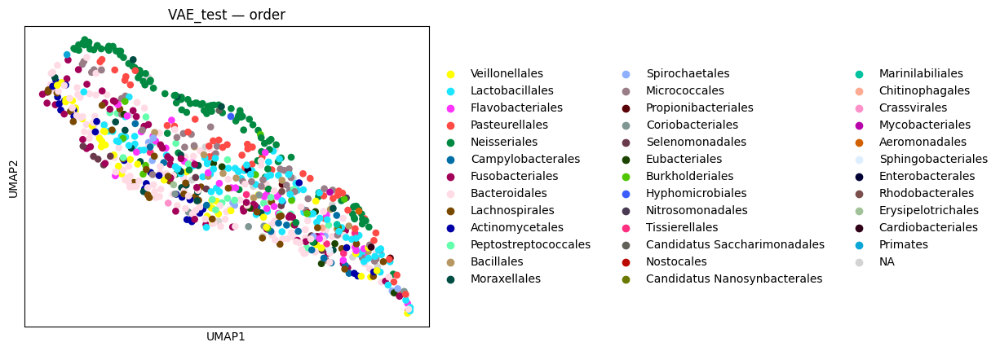

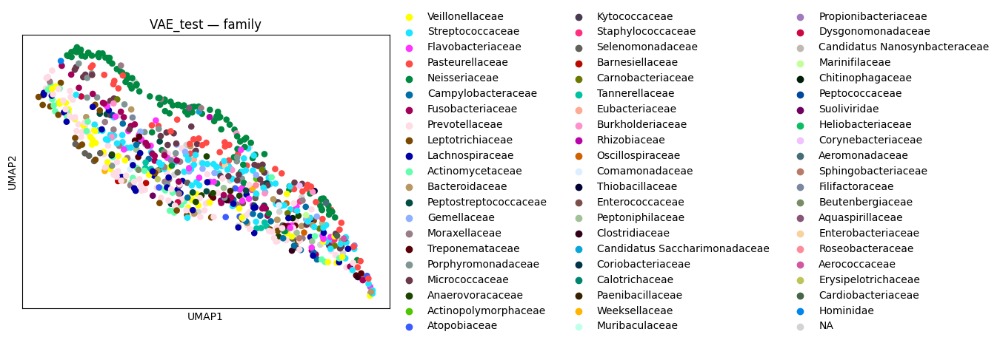


▶ Processing DAE_train: /content/drive/My Drive/Project/H5AD/DAETrain.h5ad


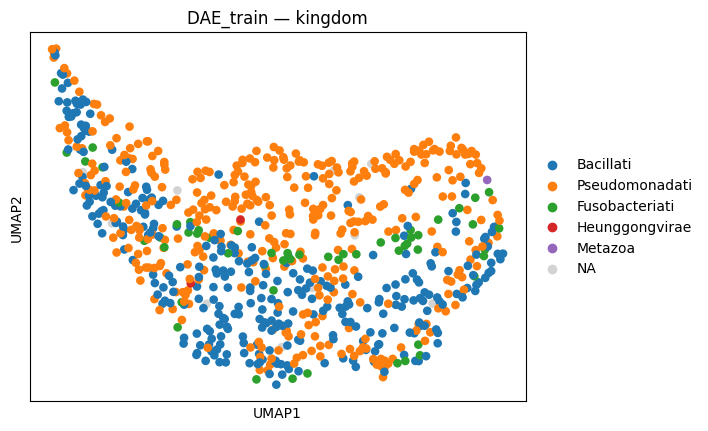

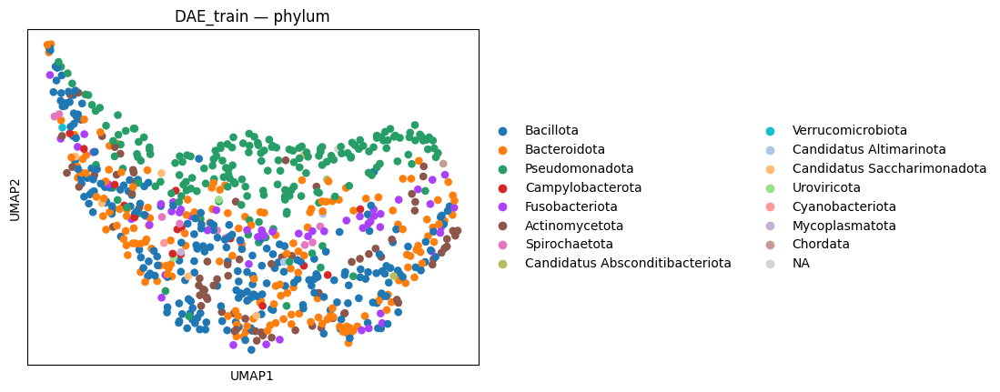

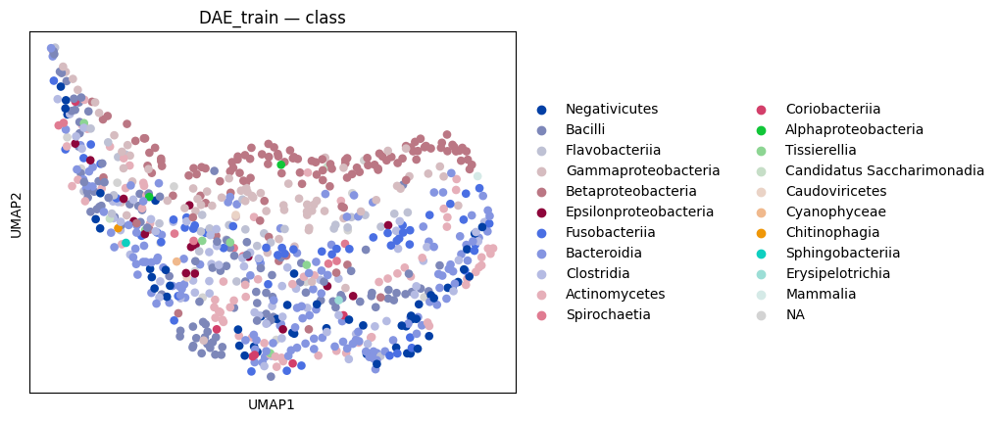

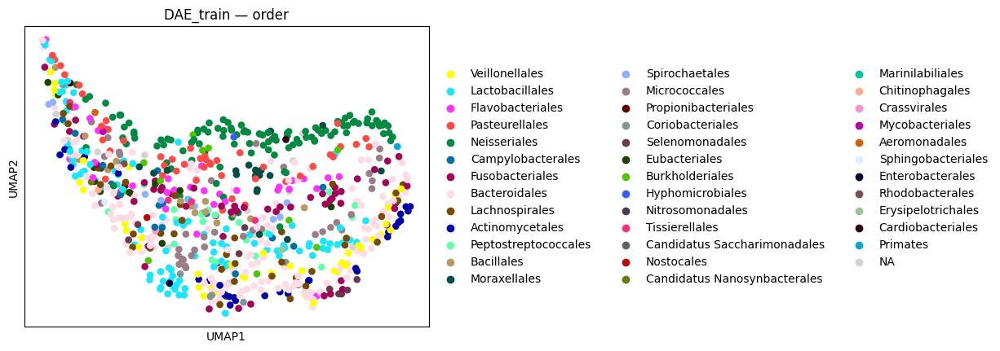

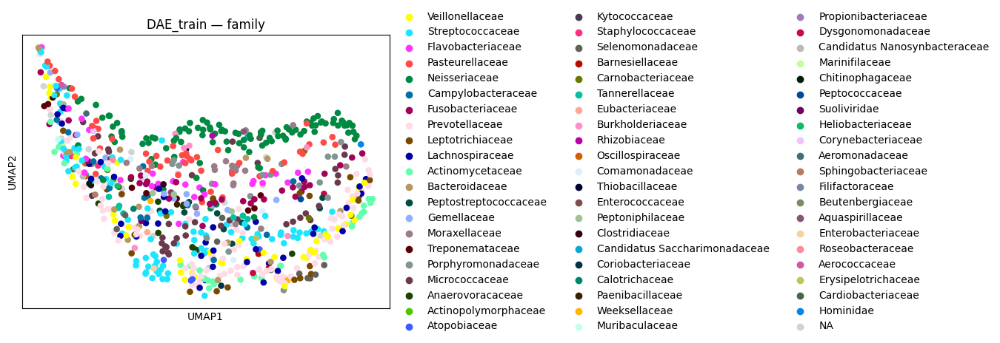


▶ Processing DAE_test: /content/drive/My Drive/Project/H5AD/DAETest.h5ad


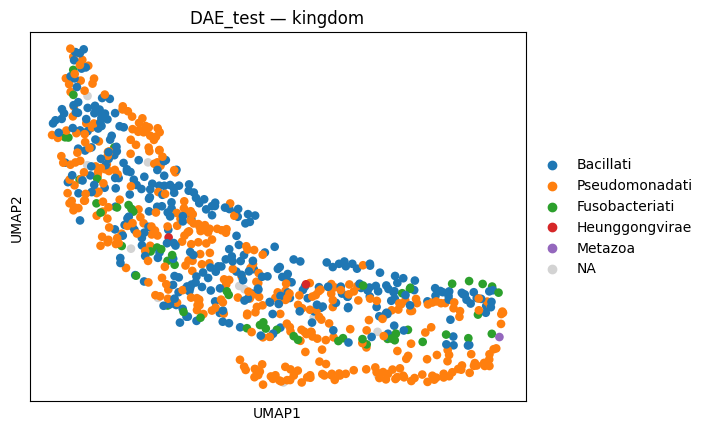

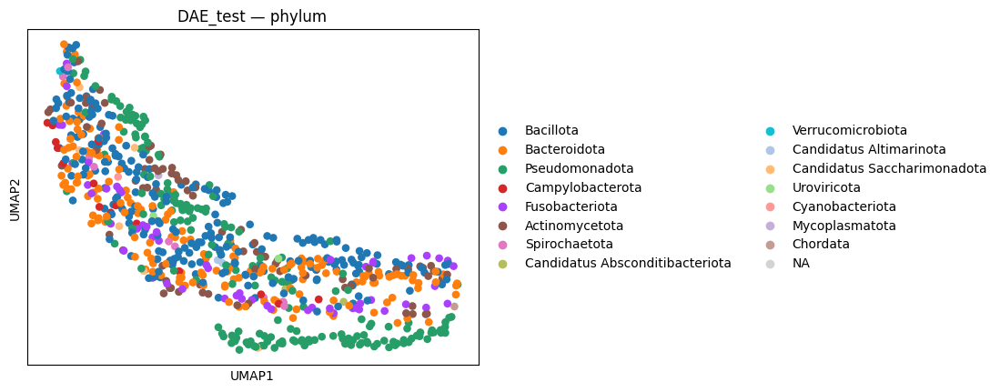

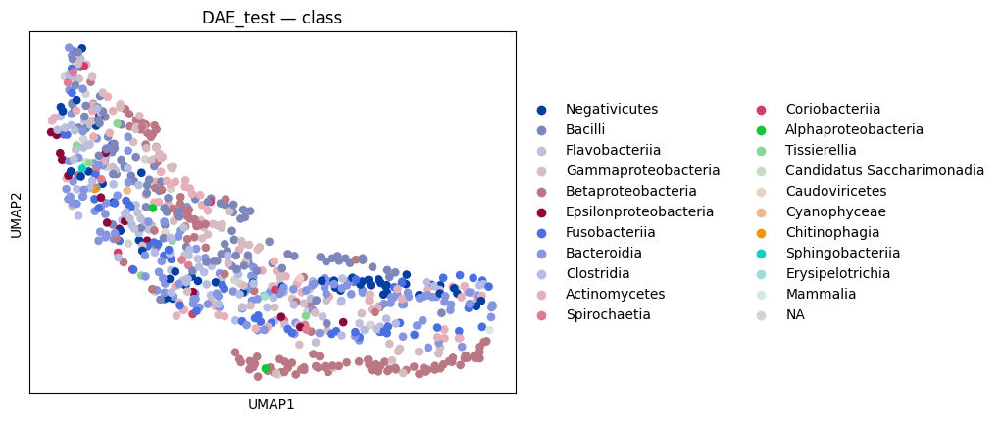

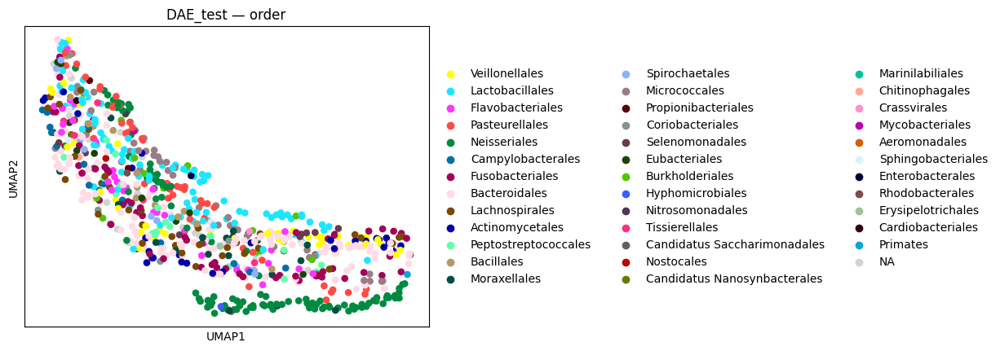

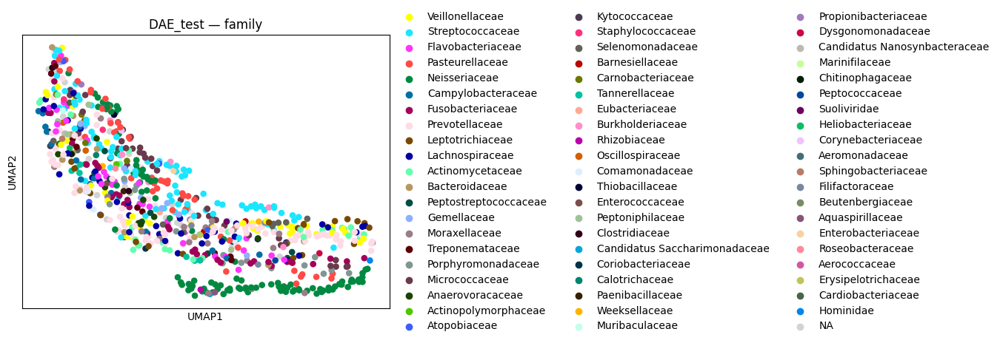


▶ Processing CFT_train: /content/drive/My Drive/Project/H5AD/CFTTrain.h5ad


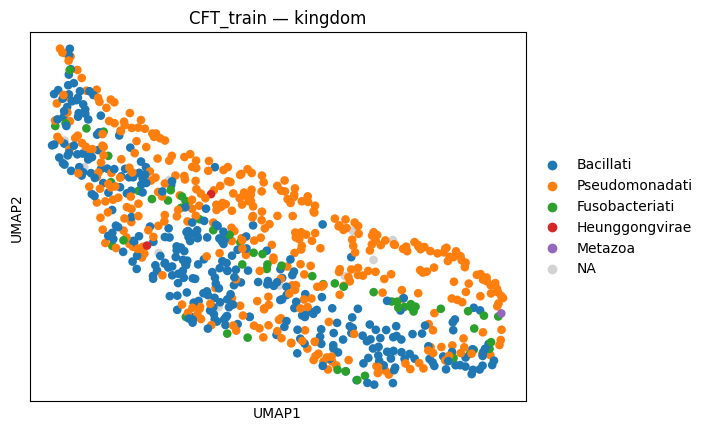

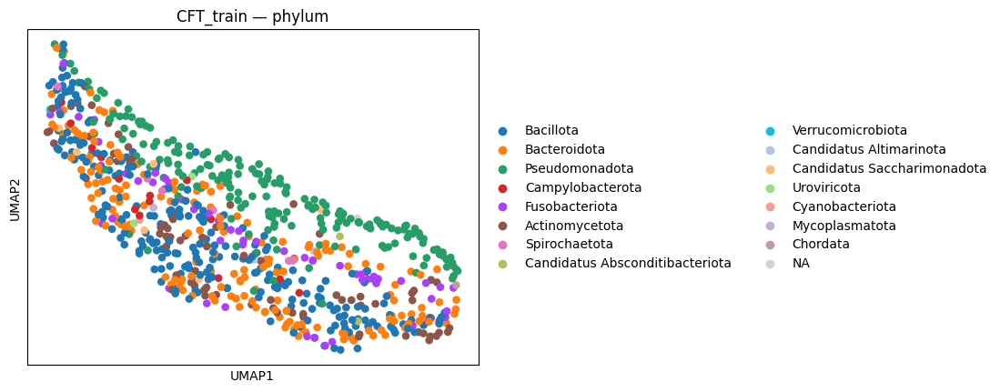

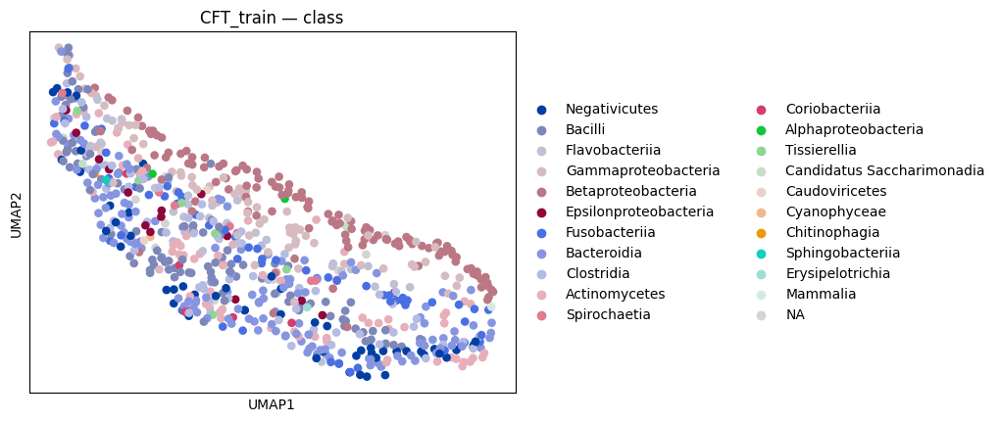

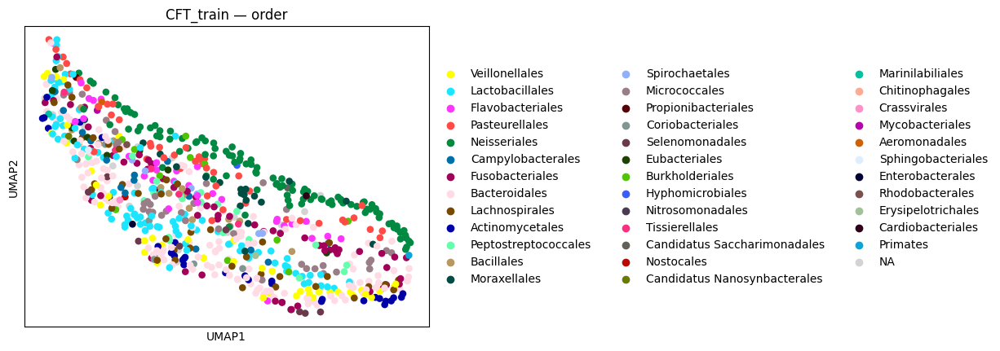

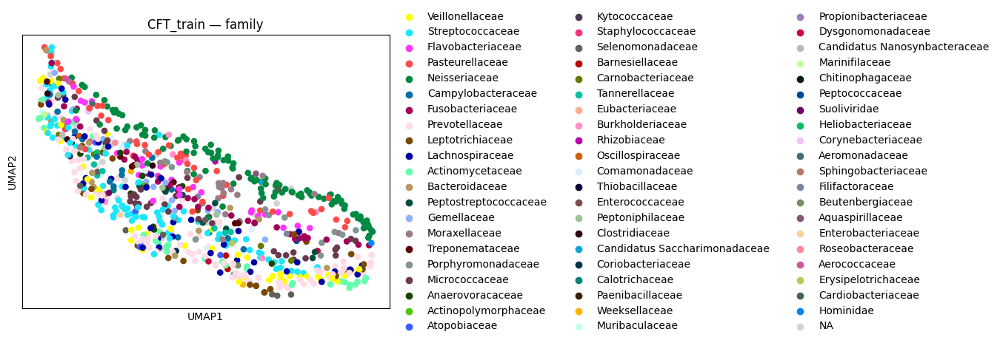


▶ Processing CFT_test: /content/drive/My Drive/Project/H5AD/CFTTest.h5ad


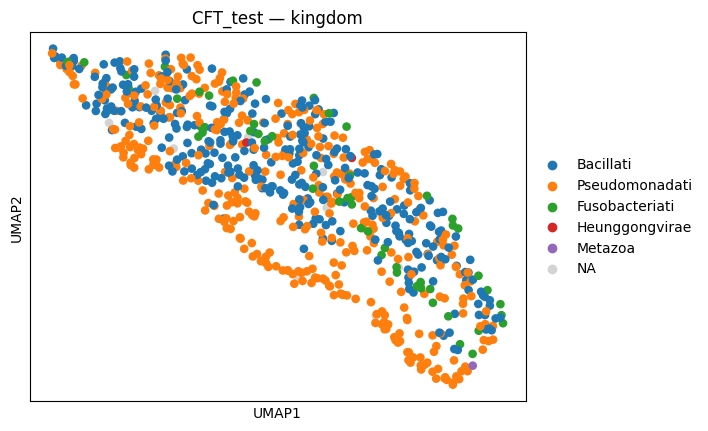

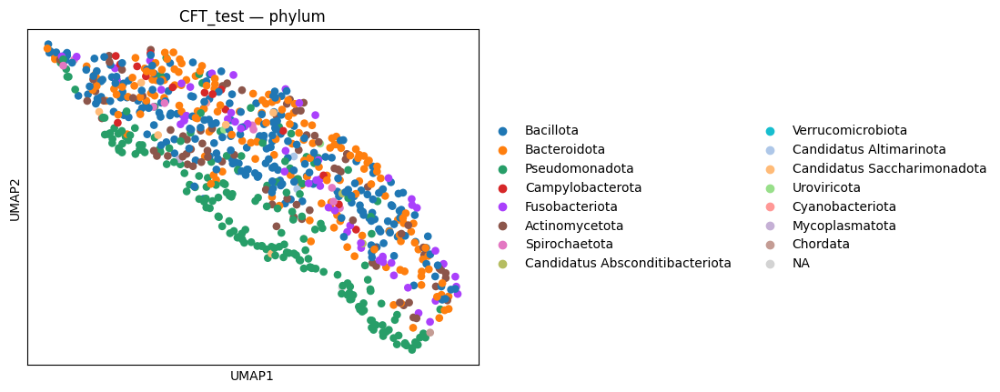

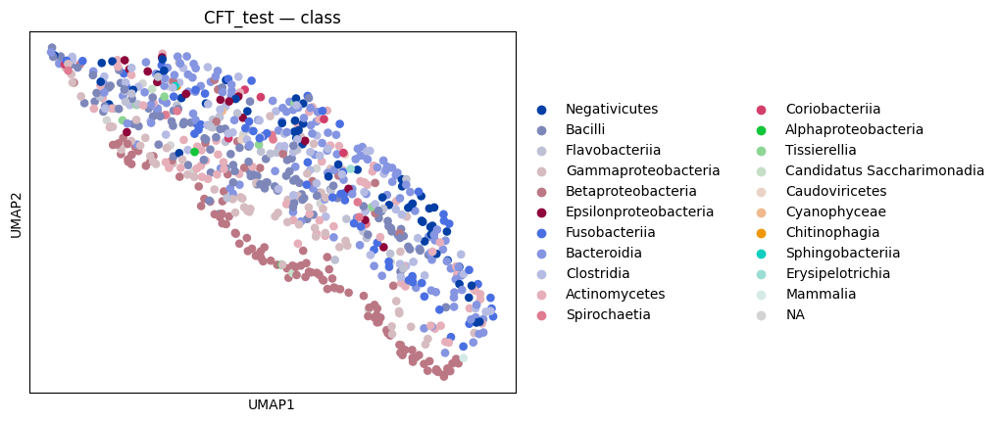

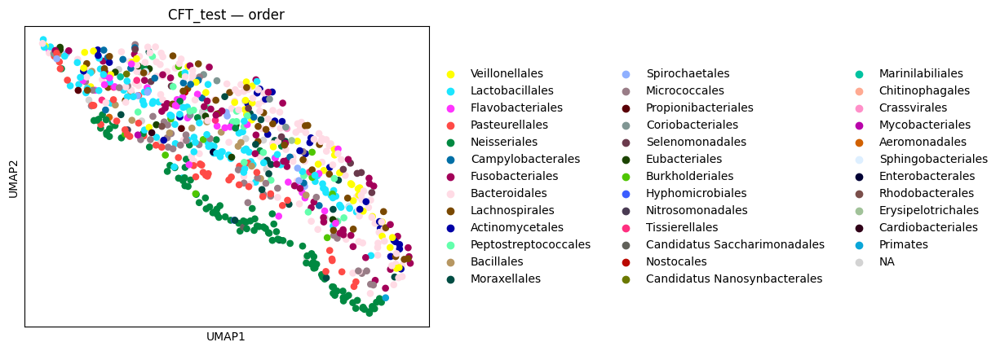

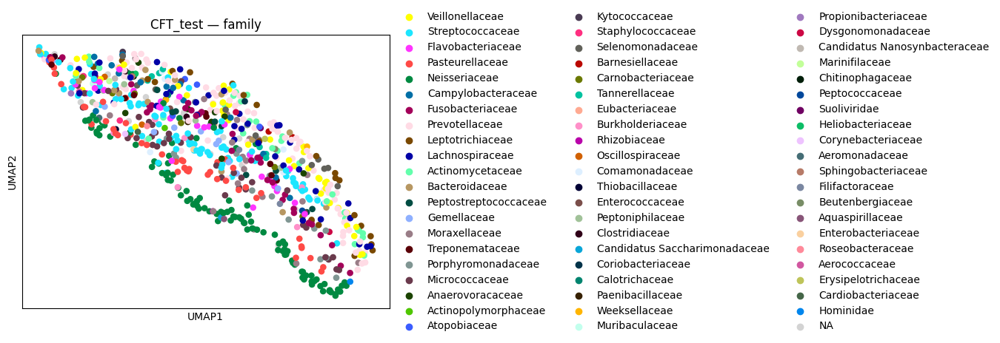


▶ Processing KNN_train: /content/drive/My Drive/Project/H5AD/KNNTrain.h5ad


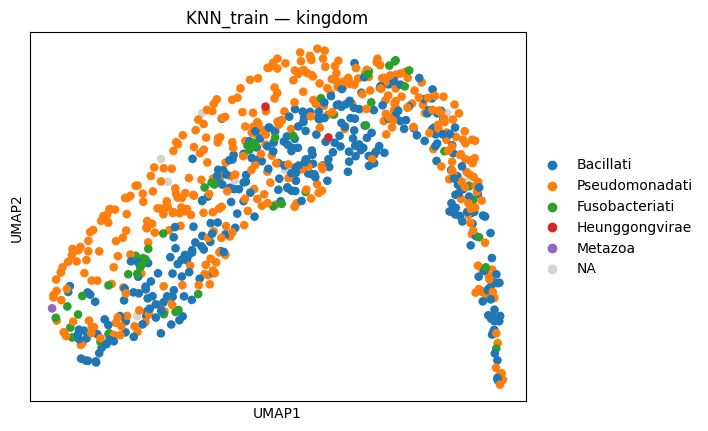

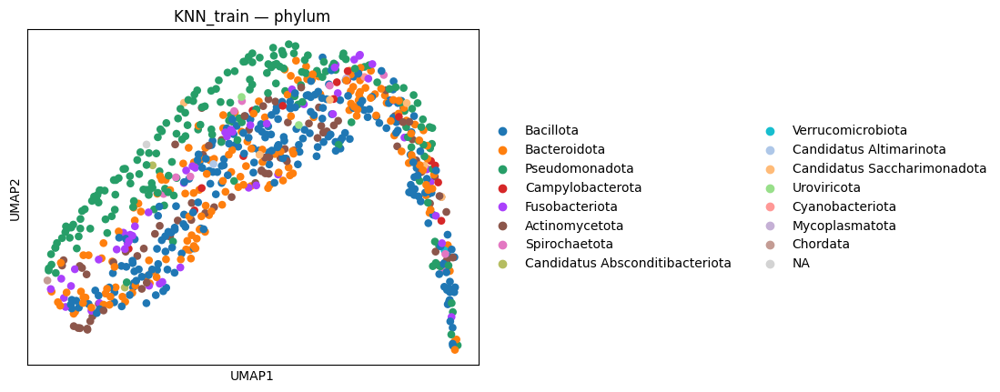

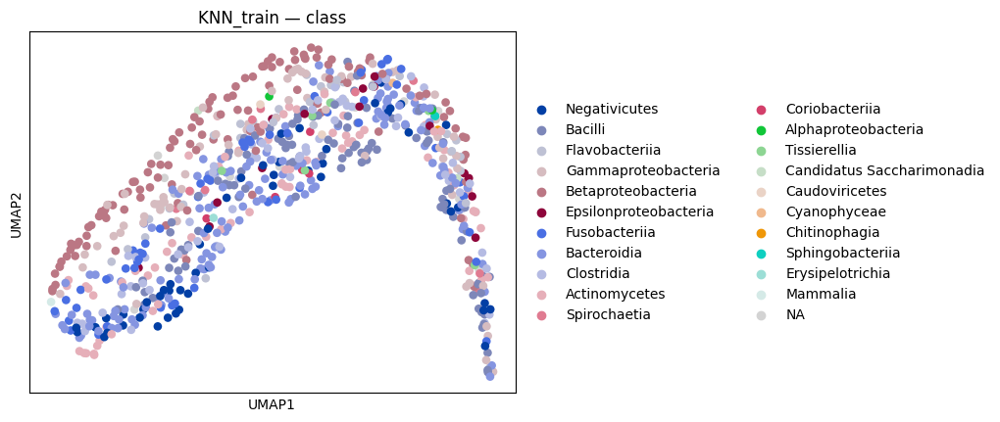

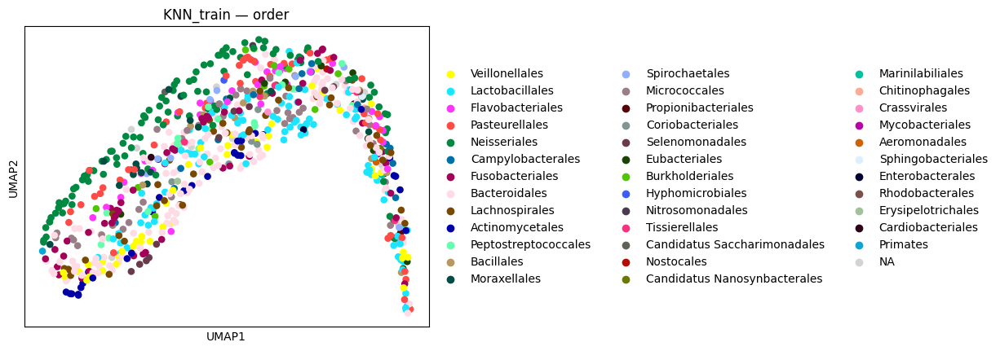

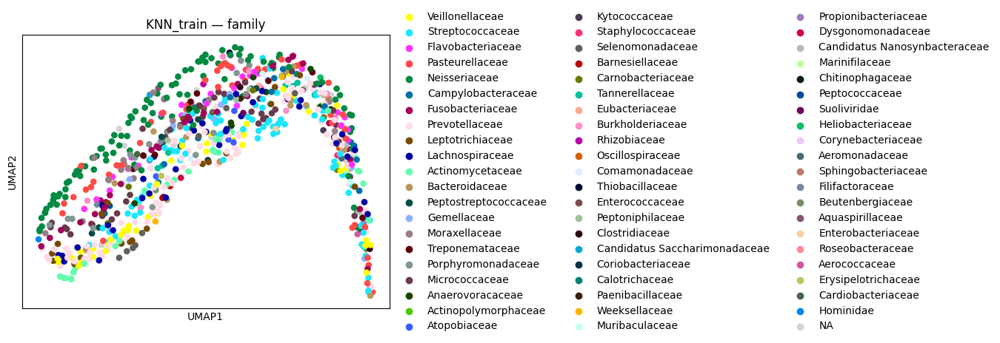


▶ Processing KNN_test: /content/drive/My Drive/Project/H5AD/KNNTest.h5ad


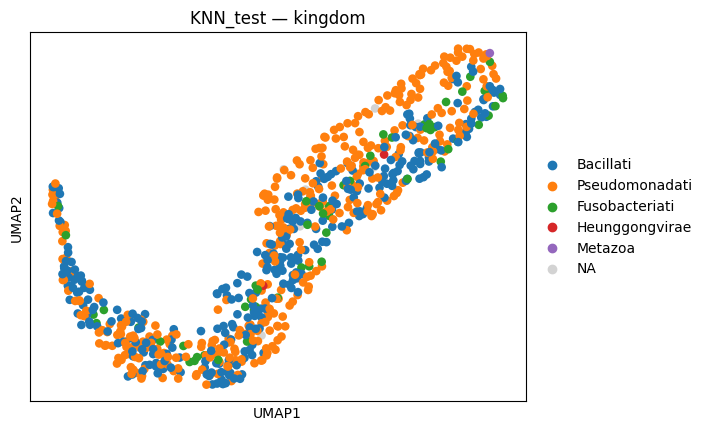

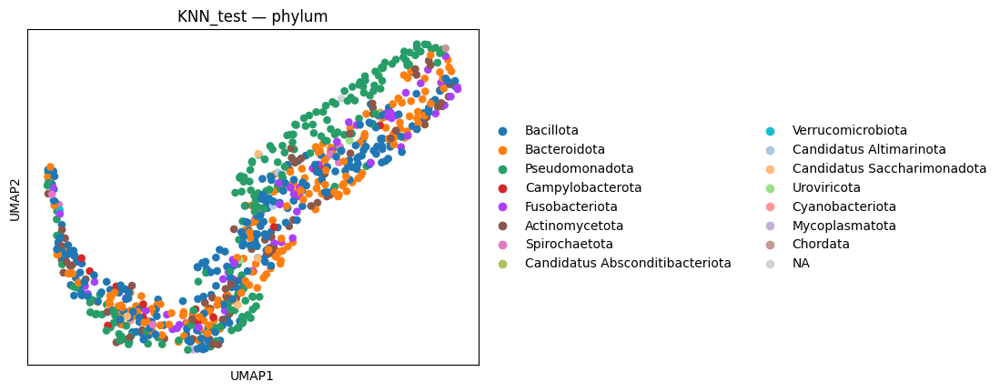

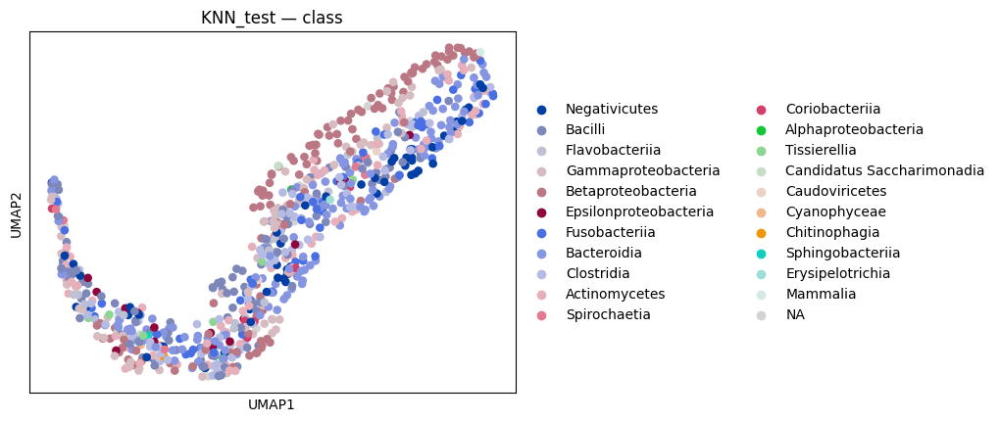

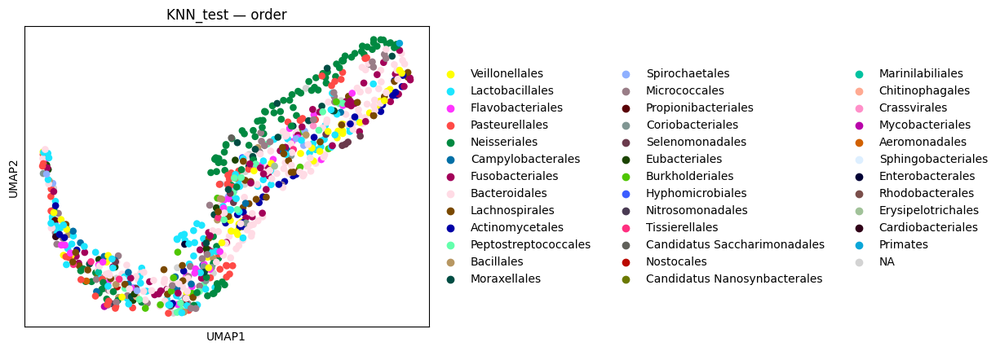

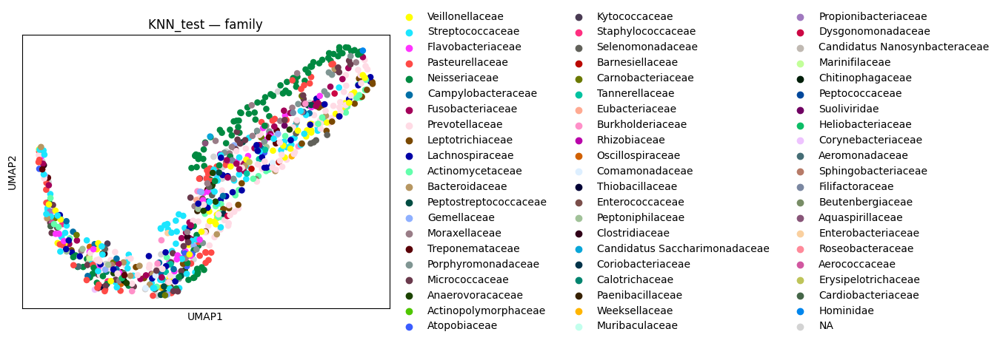


▶ Processing SVD_train: /content/drive/My Drive/Project/H5AD/SVDTrain.h5ad


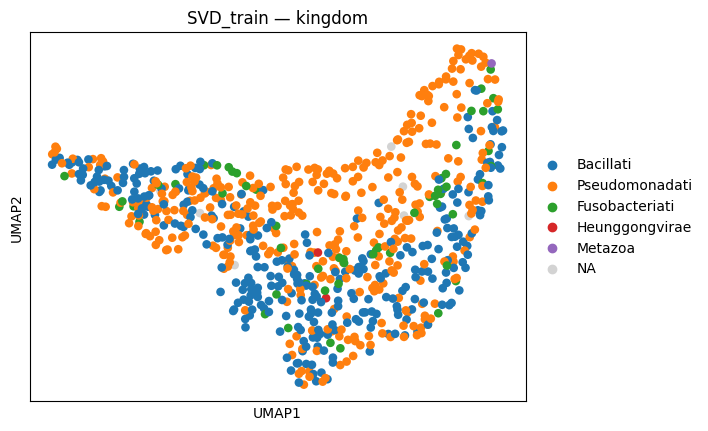

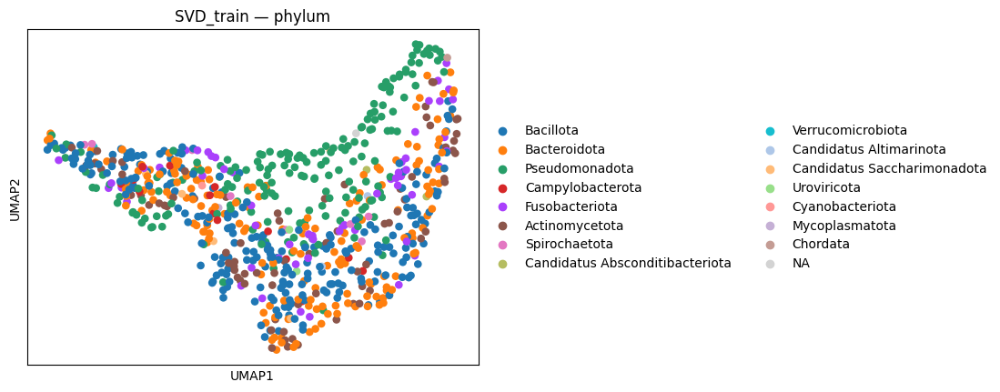

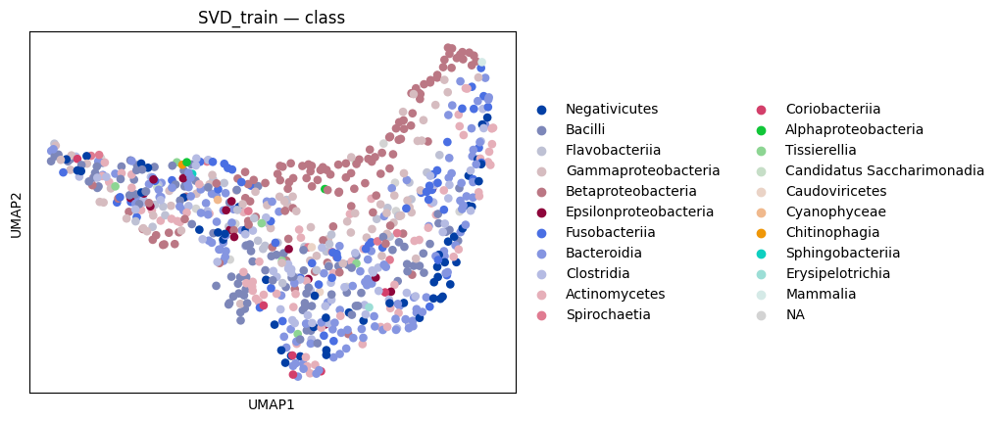

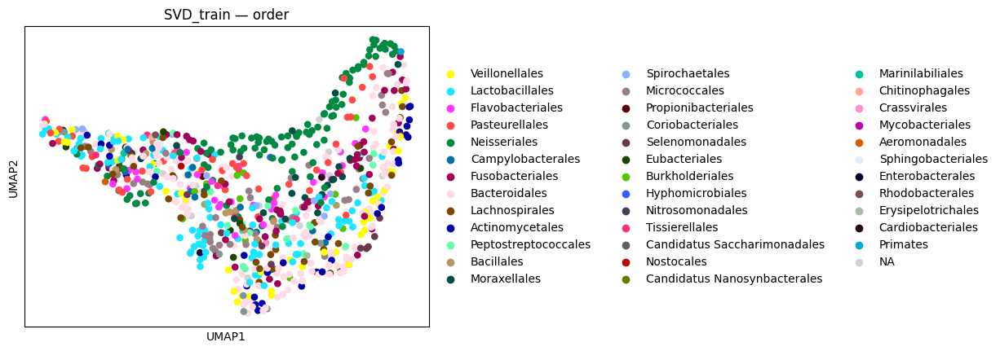

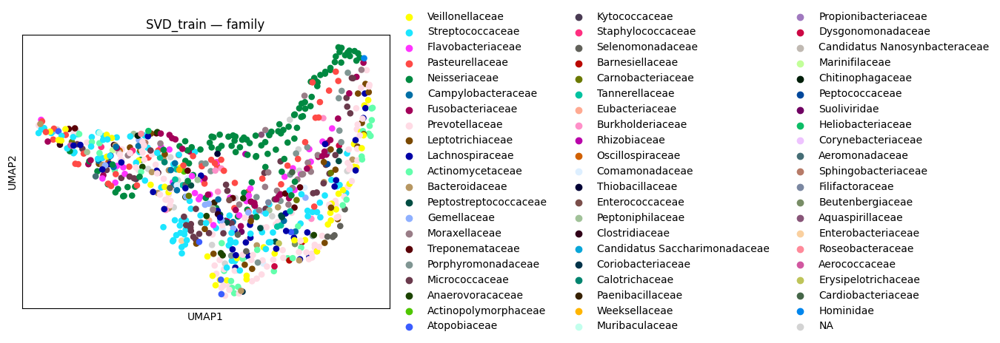


▶ Processing SVD_test: /content/drive/My Drive/Project/H5AD/SVDTest.h5ad


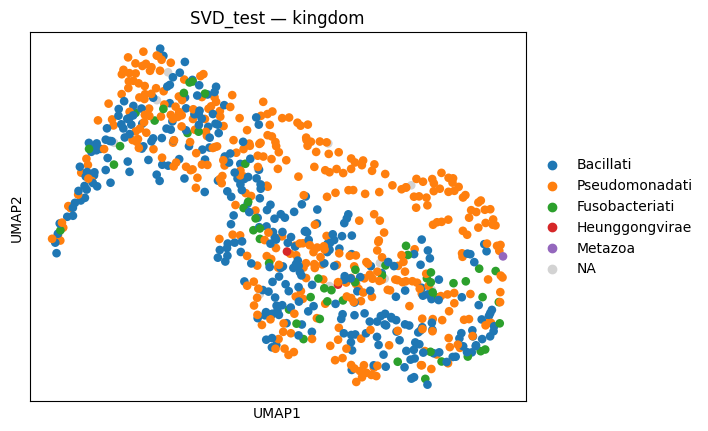

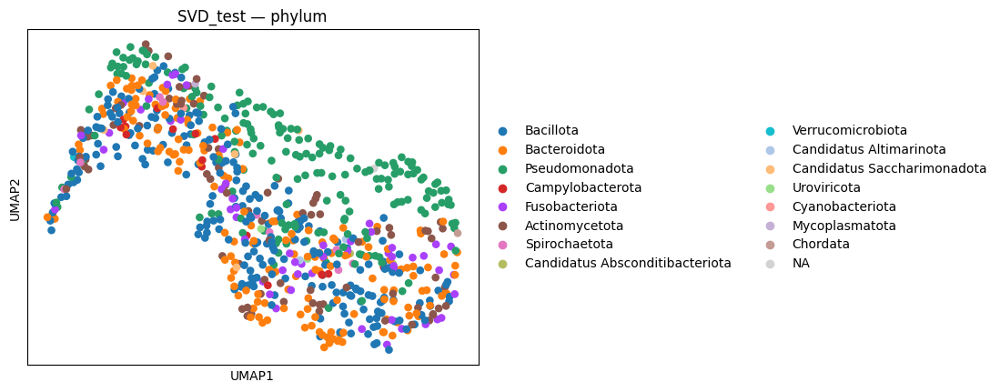

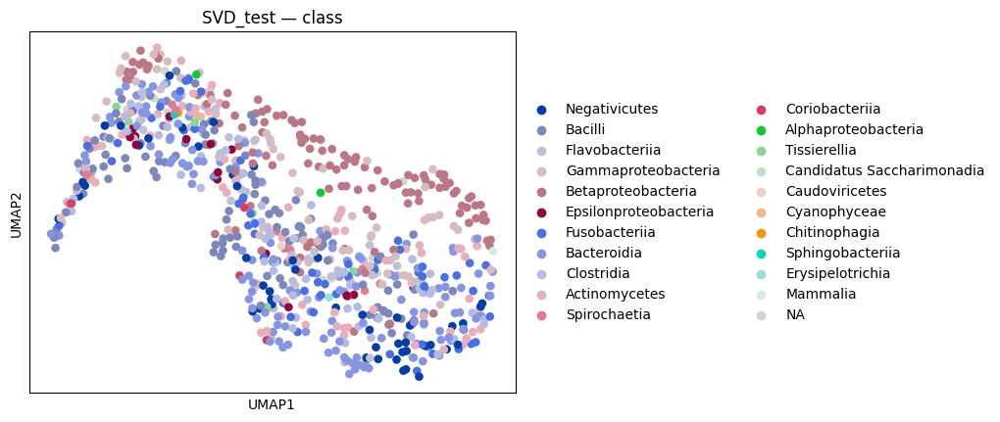

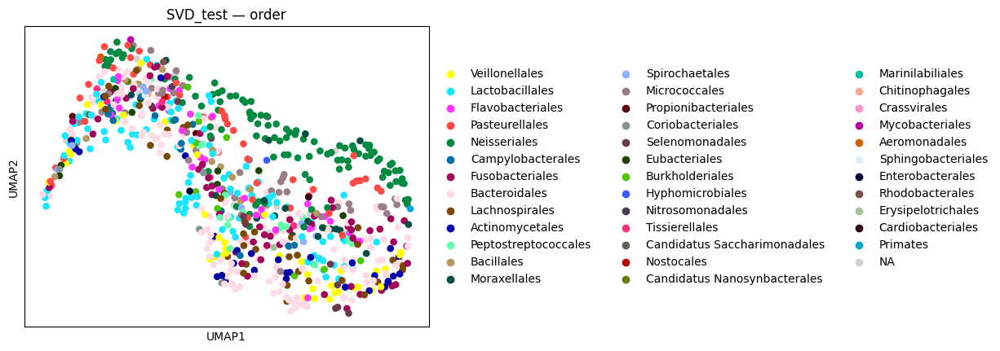

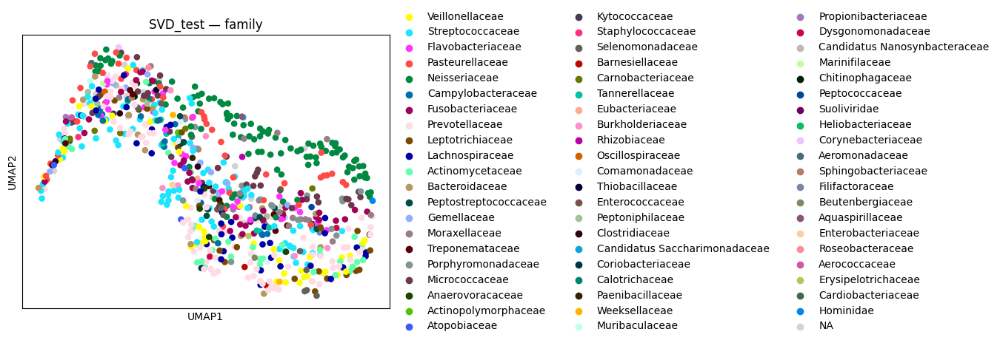


▶ Processing MLE_train: /content/drive/My Drive/Project/H5AD/MLETrain.h5ad


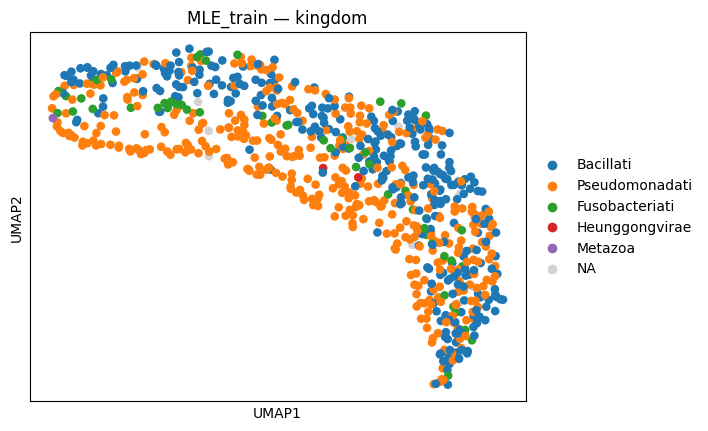

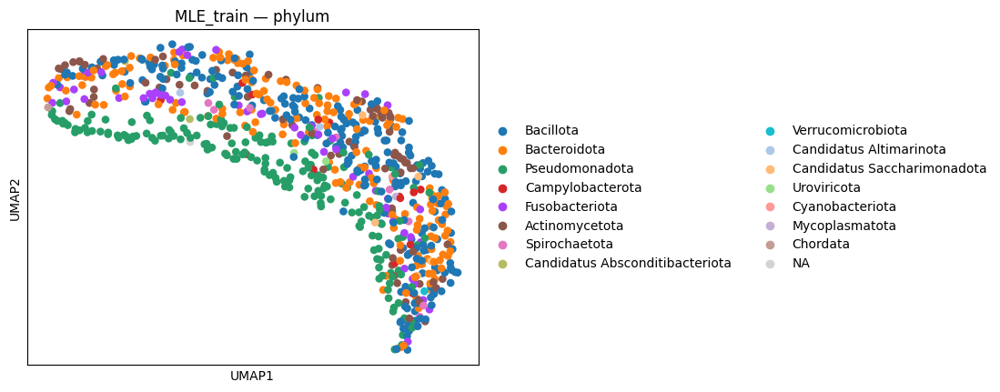

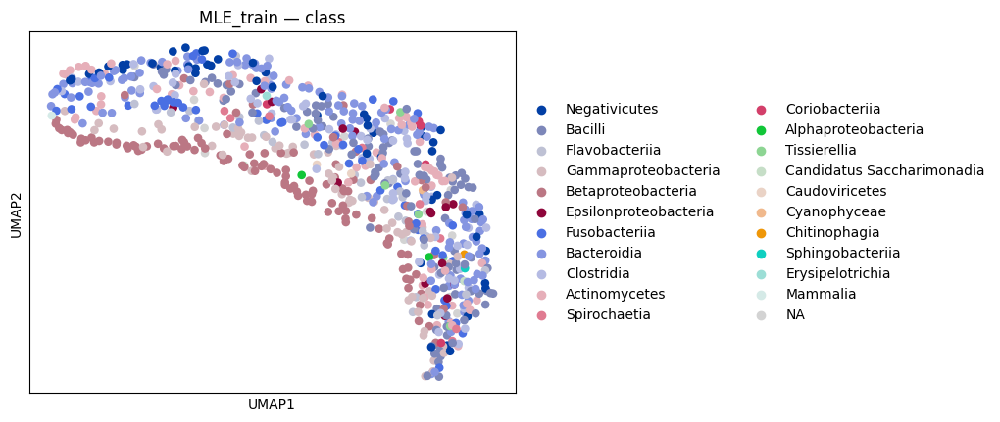

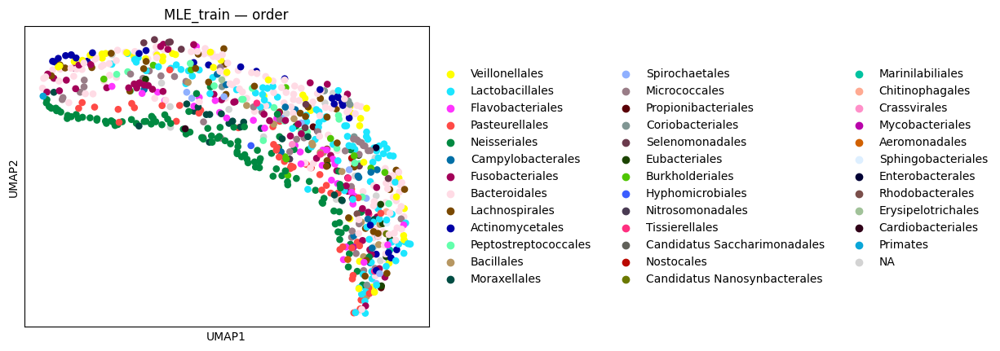

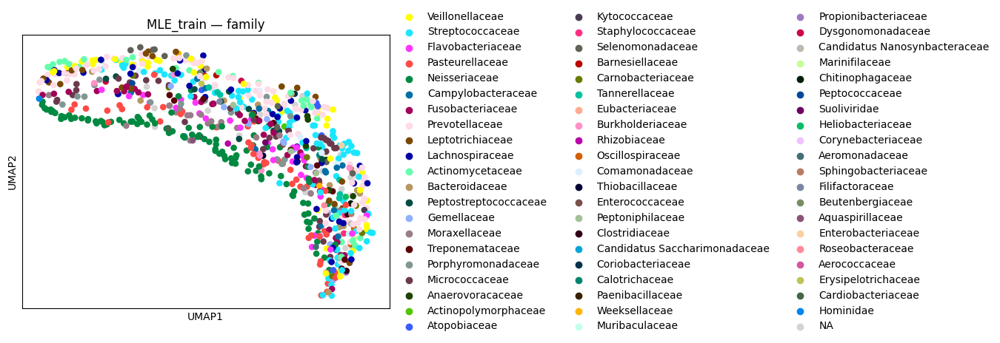


▶ Processing MLE_test: /content/drive/My Drive/Project/H5AD/MLETest.h5ad


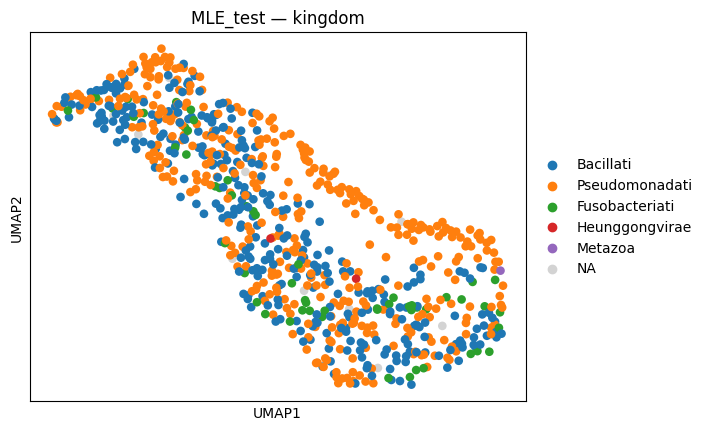

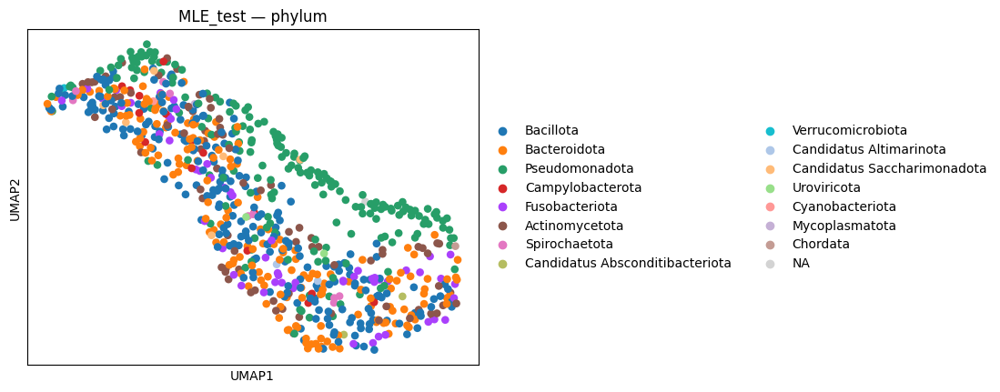

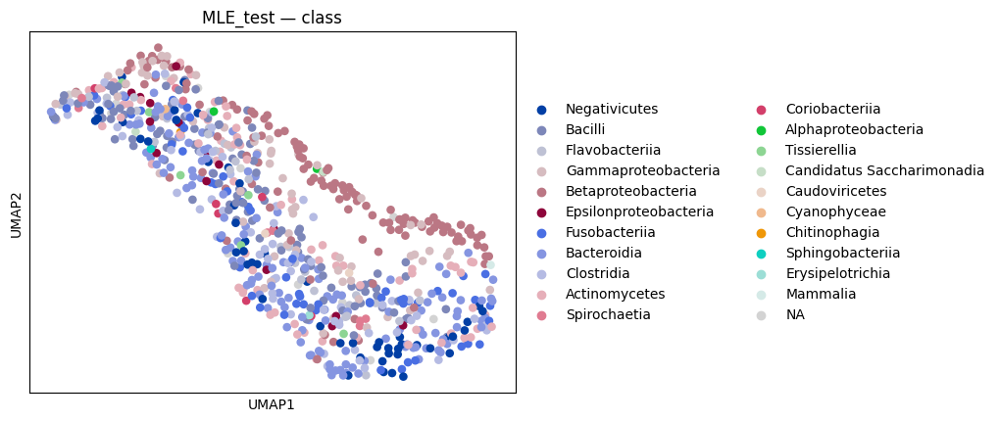

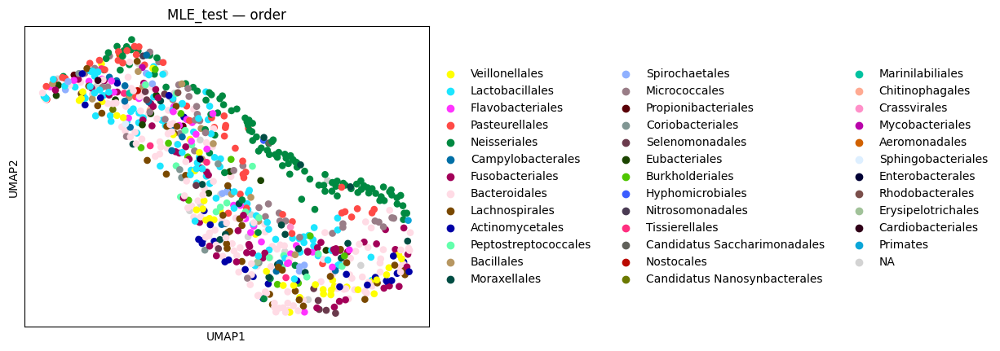

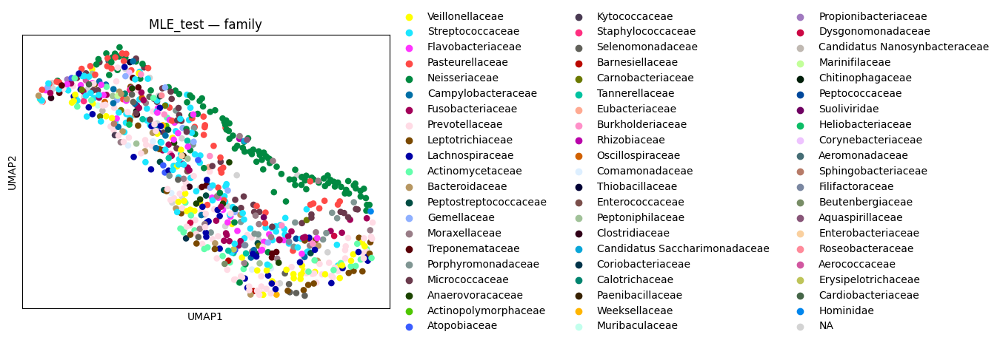


▶ Processing LC_train: /content/drive/My Drive/Project/H5AD/LCTrain.h5ad


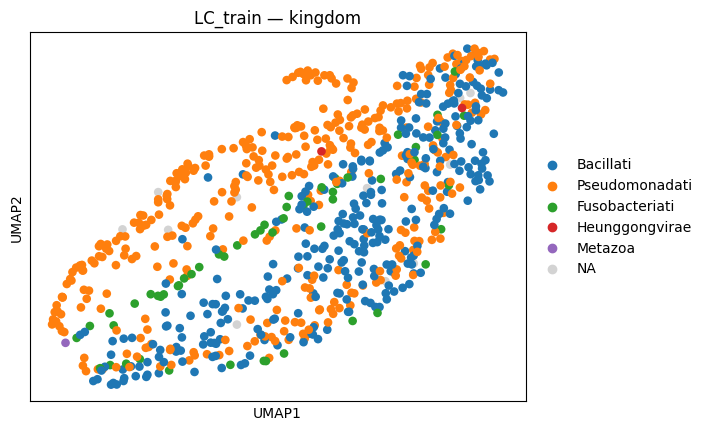

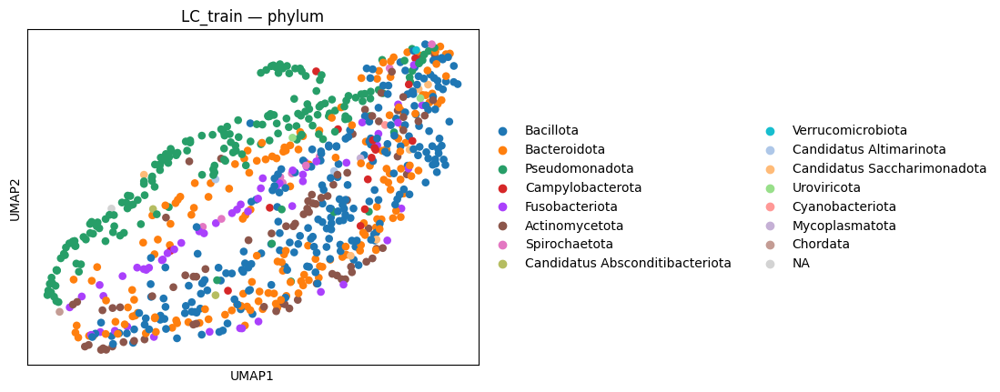

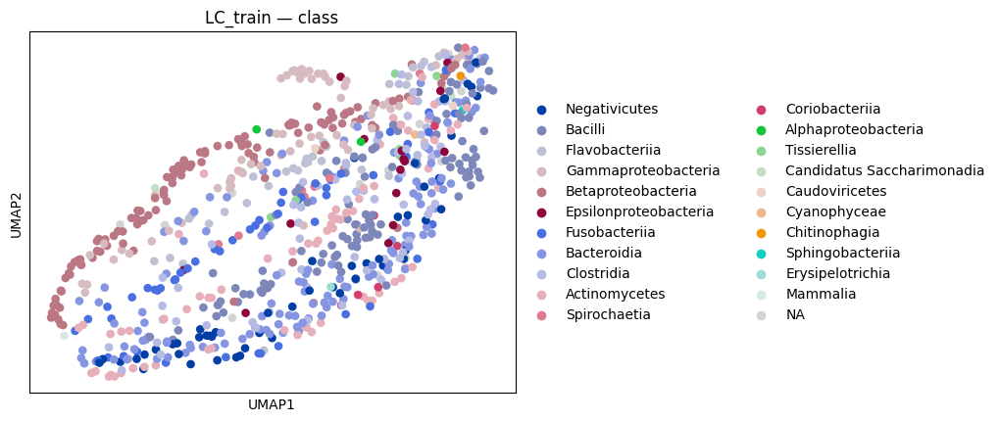

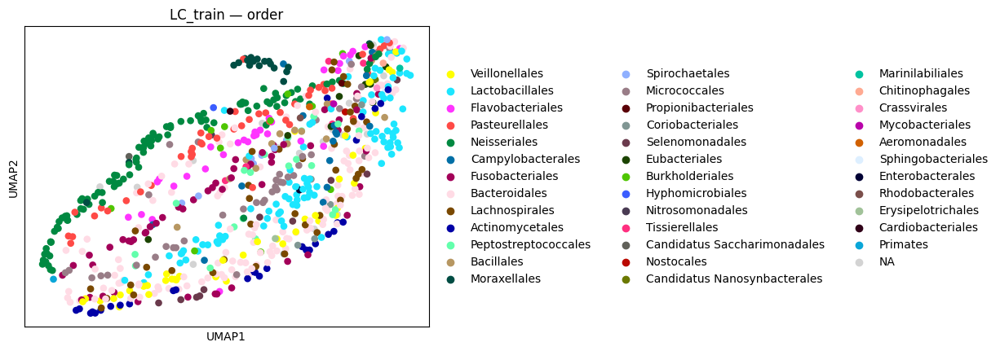

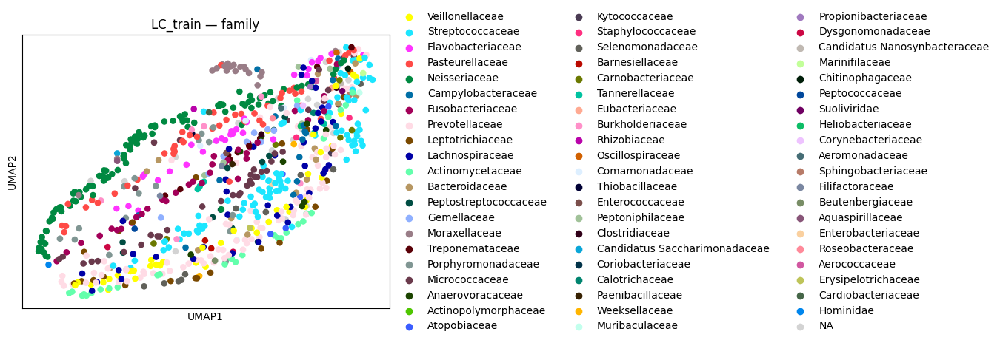


▶ Processing LC_test: /content/drive/My Drive/Project/H5AD/LCTest.h5ad


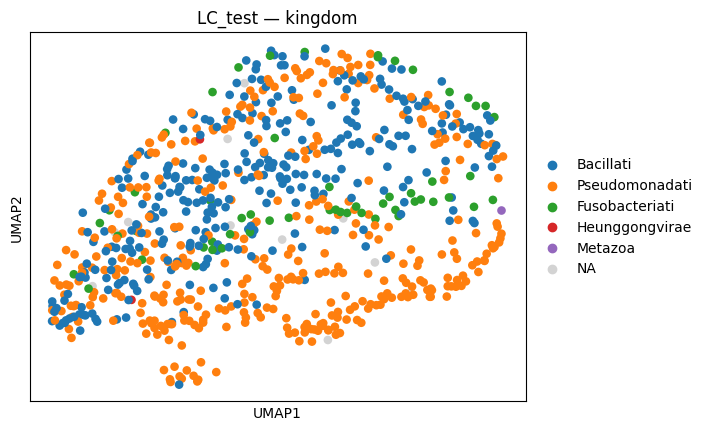

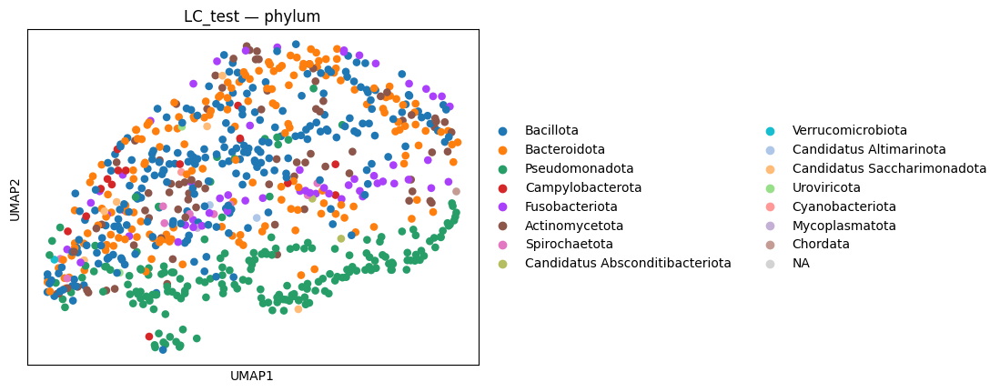

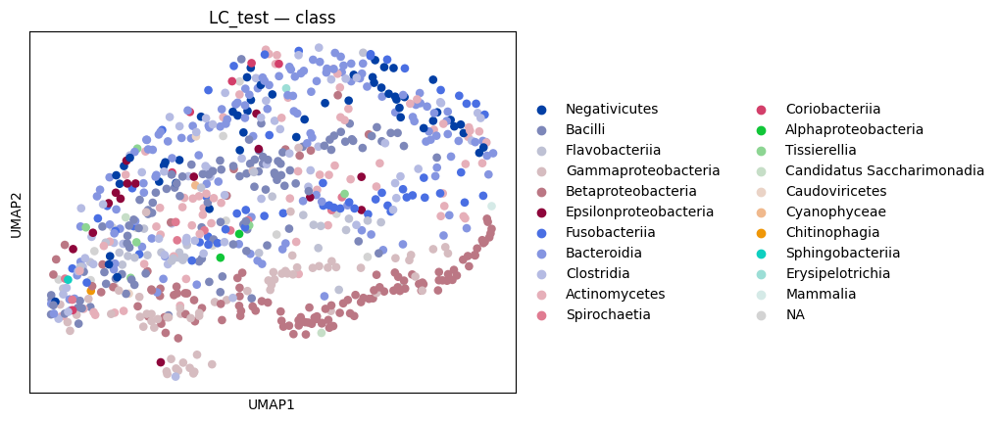

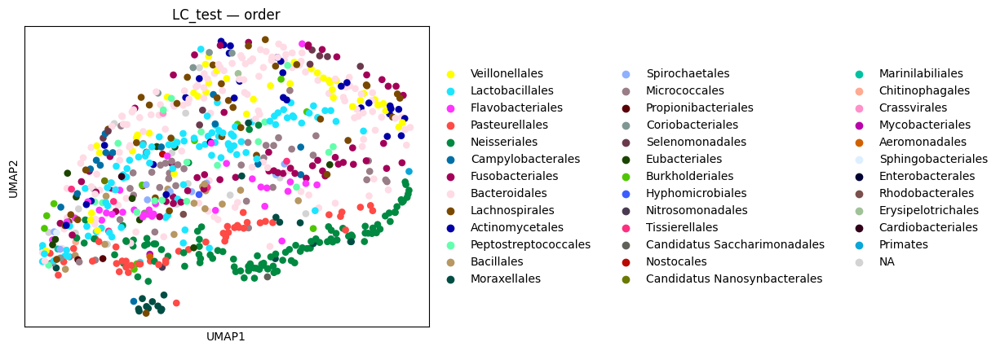

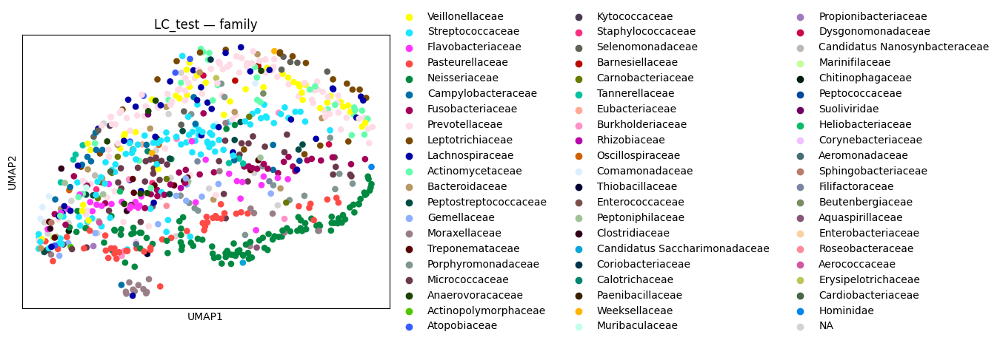


▶ Processing BPCA_train: /content/drive/My Drive/Project/H5AD/BPCATrain.h5ad


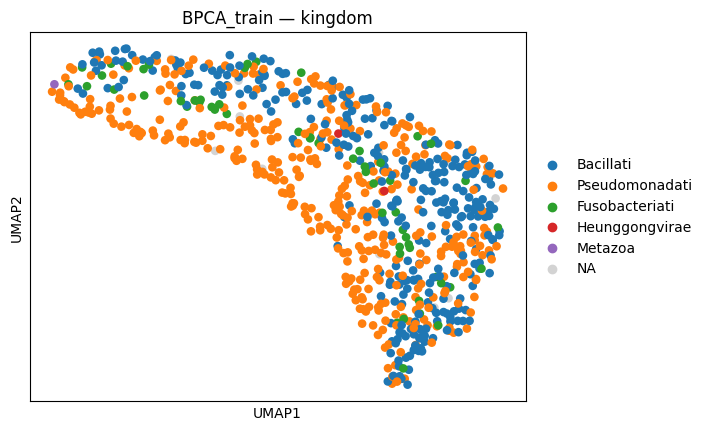

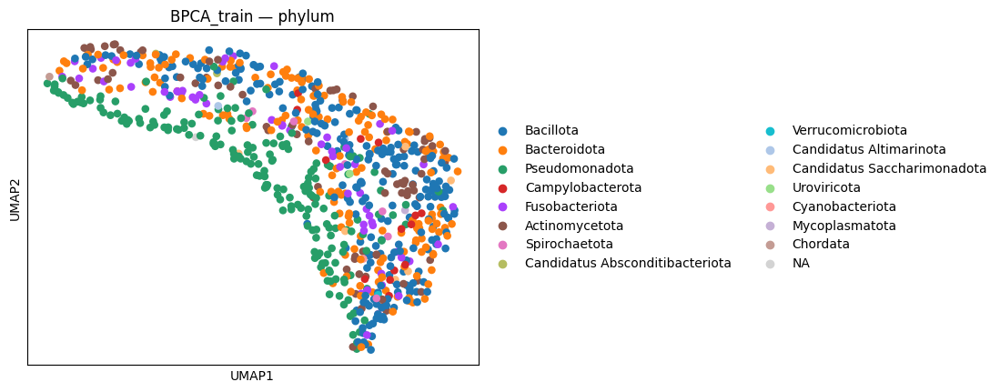

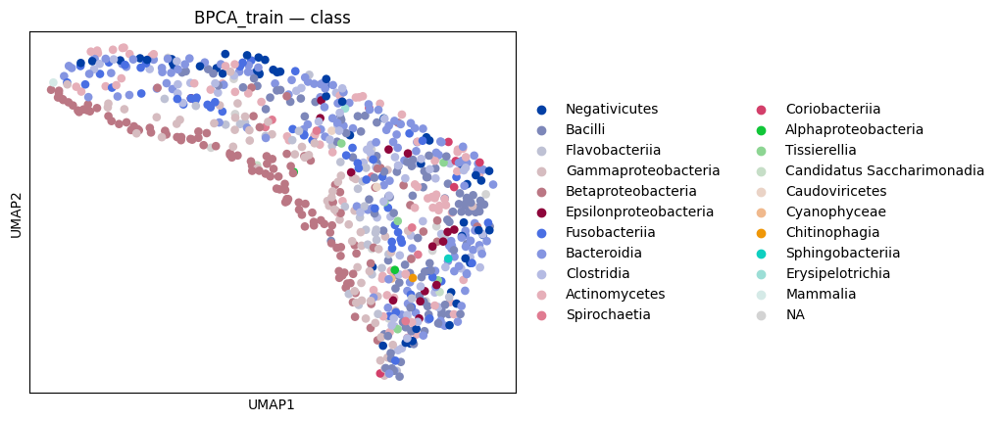

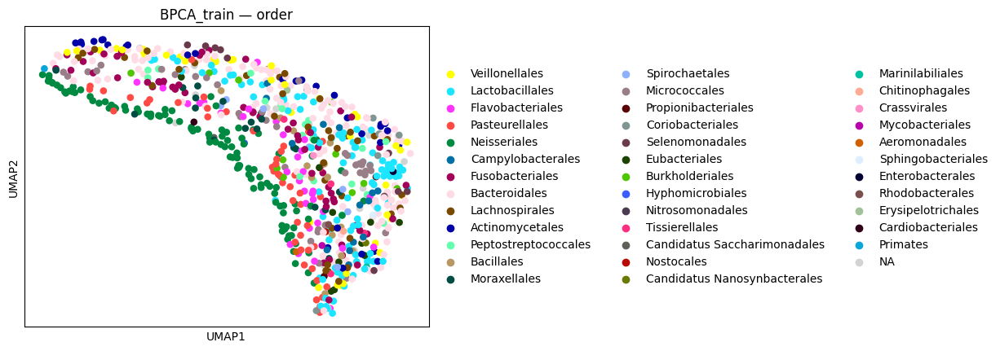

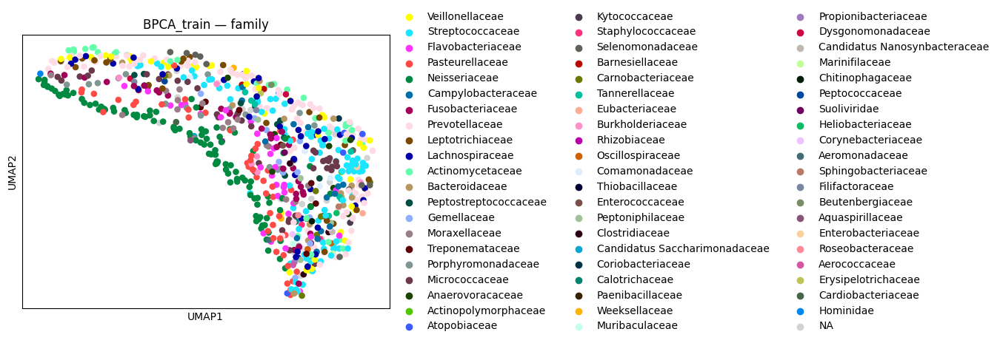


▶ Processing BPCA_test: /content/drive/My Drive/Project/H5AD/BPCATest.h5ad


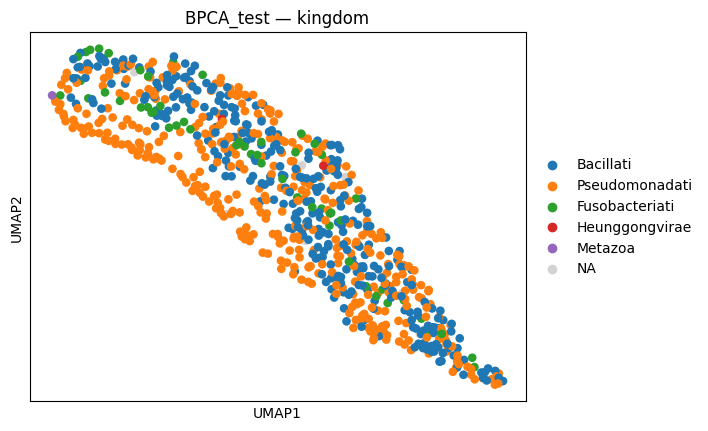

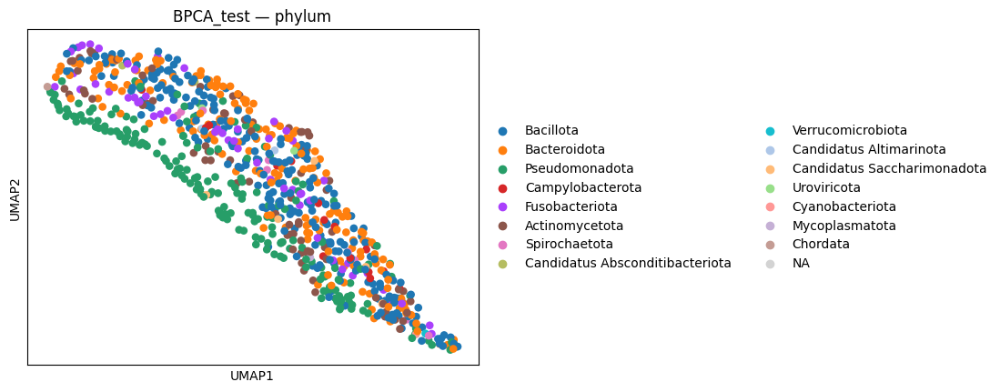

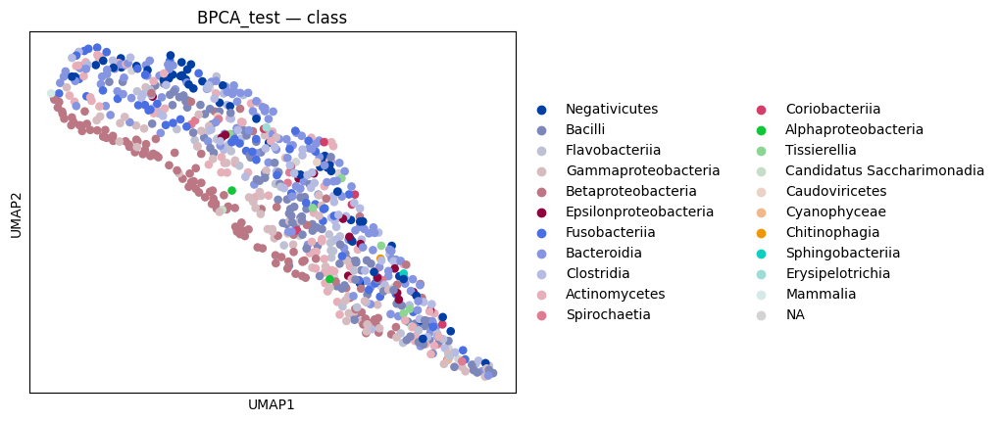

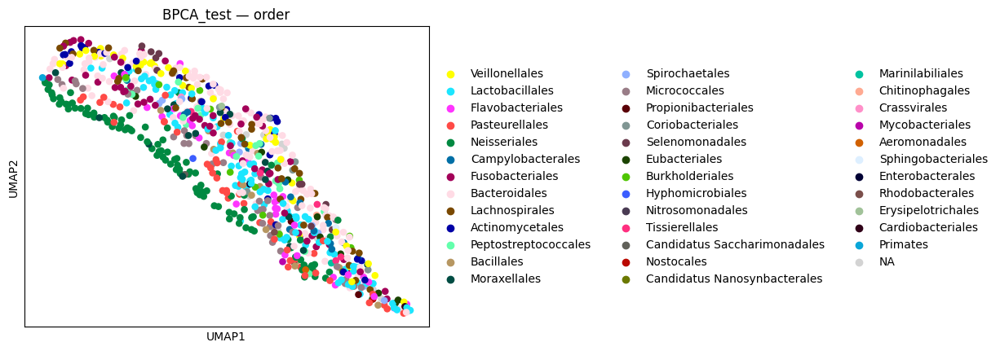

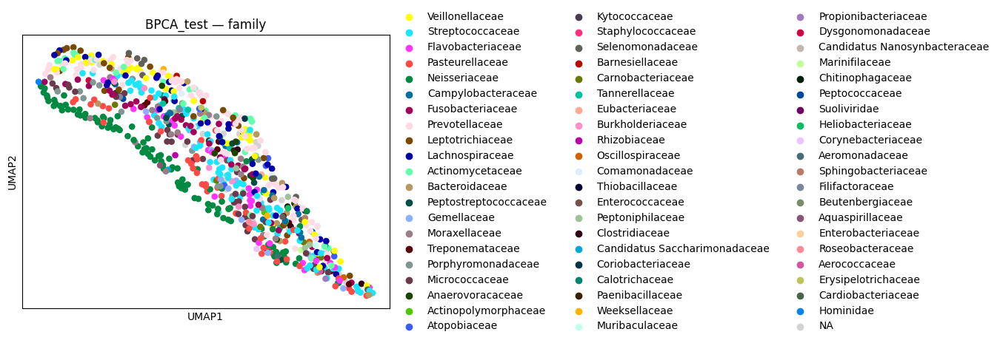

In [ ]:
def plot_umaps_by_ranks(
    file_list,
    obs_fields=['kingdom', 'phylum', 'class', 'order', 'family'],
    umap_neighbors=15,
    umap_min_dist=0.5
):

    for label, path in file_list:
        print(f"\n▶ Processing {label}: {path}")
        # Load data
        adata = sc.read_h5ad(path)

        # Compute neighborhood graph & UMAP
        sc.pp.neighbors(adata,
                        use_rep='X',
                        n_neighbors=umap_neighbors)
        sc.tl.umap(adata,
                   min_dist=umap_min_dist)

        # Plot one UMAP per obs_field
        for field in obs_fields:
            if field not in adata.obs:
                print(f"   ✗ Skipping '{field}': not found in .obs")
                continue

            sc.pl.umap(
                adata,
                color=field,
                title=f"{label} — {field}",
                show=True
            )

# === Example usage ===
file_list = [
    ("AE_train",  file_AE_train_imputed_h5ad),
    ("AE_test",   file_AE_test_imputed_h5ad),
    ("VAE_train",  file_VAE_train_imputed_h5ad),
    ("VAE_test",   file_VAE_test_imputed_h5ad),
    ("DAE_train",  file_DAE_train_imputed_h5ad),
    ("DAE_test",   file_DAE_test_imputed_h5ad),
    ("CFT_train",  file_CFT_train_imputed_h5ad),
    ("CFT_test",   file_CFT_test_imputed_h5ad),
    # ("EM_train",   file_EM_train_imputed_h5ad),
    # ("EM_test",    file_EM_test_imputed_h5ad),
    ("KNN_train",  file_KNN_train_imputed_h5ad),
    ("KNN_test",   file_KNN_test_imputed_h5ad),
    ("SVD_train",  file_SVD_train_imputed_h5ad),
    ("SVD_test",   file_SVD_test_imputed_h5ad),
    ("MLE_train",  file_MLE_train_imputed_h5ad),
    ("MLE_test",   file_MLE_test_imputed_h5ad),
    ("LC_train",   file_LC_train_imputed_h5ad),
    ("LC_test",    file_LC_test_imputed_h5ad),
    ("BPCA_train", file_BPCA_train_imputed_h5ad),
    ("BPCA_test",  file_BPCA_test_imputed_h5ad),
]

plot_umaps_by_ranks(
    file_list,
    obs_fields=['kingdom', 'phylum', 'class', 'order', 'family'],
    umap_neighbors=15,
    umap_min_dist=0.5
)

# 4. Cluster Quality Evaluator

In [ ]:
class ClusterQualityEvaluator:
    """
    Evaluate cluster quality metrics (DB, CH, Silhouette) for given AnnData object
    across specified obs fields and using specified distance metrics.

    Metrics supported:
      - 'hellinger'
      - 'aitchison'
      - 'angular'

    Usage:
        evaluator = ClusterQualityEvaluator(adata, obs_fields=['root', 'phylum', ...])
        results_df = evaluator.compute_scores()
    """

    def __init__(self, adata, obs_fields=None, pseudocount=1e-6):
        # Store AnnData object and parameters
        self.adata = adata
        self.obs_fields = obs_fields if obs_fields is not None else []
        self.pseudocount = pseudocount
        # Extract data as dense array
        X = adata.X
        if hasattr(X, 'toarray'):
            X = X.toarray()
        self.data = np.asarray(X, dtype=float)
        # Index mapping for obs
        self.obs = adata.obs

    def _filter_labels(self, labels):
        # Convert to pandas Series and drop NA/None/empty
        s = pd.Series(labels).astype('category')
        mask = s.notna() & (s.astype(str) != '')
        return s[mask], mask.values

    def _transform(self, X, metric):
        """Transform data X (n_samples x n_features) per metric."""
        if metric == 'hellinger':
            # row-wise normalization to relative abundances
            row_sums = X.sum(axis=1, keepdims=True)
            P = X / np.where(row_sums == 0, 1, row_sums)
            return np.sqrt(P)
        elif metric == 'aitchison':
            # pseudocount, composition, clr transform
            X_pc = X + self.pseudocount
            P = X_pc / X_pc.sum(axis=1, keepdims=True)
            logP = np.log(P)
            gm = np.exp(logP.mean(axis=1, keepdims=True))
            # clr = log(P) - log(gm)
            return logP - np.log(gm)
        elif metric in ('angular', 'cosine'):
            # unit normalization
            norms = np.linalg.norm(X, axis=1, keepdims=True)
            return X / np.where(norms == 0, 1, norms)
        else:
            raise ValueError(f"Unsupported metric '{metric}'")

    def compute_scores(self):
        """
        Compute DB, CH, and Silhouette scores for each obs field and metric.

        Returns:
            pandas.DataFrame with columns: ['obs_field', 'metric', 'db', 'ch', 'silhouette']
        """
        records = []
        metrics = ['hellinger', 'aitchison', 'angular']

        for obs_field in self.obs_fields:
            labels = self.obs[obs_field]
            # Filter out missing/empty labels
            valid_labels, mask = self._filter_labels(labels)
            if valid_labels.nunique() < 2:
                # Skip if fewer than 2 clusters
                continue

            X_sub = self.data[mask]
            y = valid_labels.cat.codes.values

            for m in metrics:
                Xm = self._transform(X_sub, m)

                try:
                    db = davies_bouldin_score(Xm, y)
                    ch = calinski_harabasz_score(Xm, y)
                    sil = silhouette_score(Xm, y, metric='euclidean')
                except Exception as e:
                    db = ch = sil = np.nan

                records.append({
                    'obs_field': obs_field,
                    'metric': m,
                    'db': db,
                    'ch': ch,
                    'silhouette': sil
                })

        return pd.DataFrame.from_records(records)

In [ ]:
class MultiClusterQualityEvaluator:
    """
    Evaluate cluster‐quality metrics (DB, CH, Silhouette) for multiple .h5ad files.

    For each file, for each obs_field (taxonomic rank), it:
      - Drops the Na cluster
      - Drops any clusters with fewer than min_cluster_size members
      - Computes metrics on the remaining samples

    Finally merges all results into one DataFrame with index=obs_field and columns:
      [data, imputer, metric, db, ch, silhouette]
    """

    def __init__(
        self,
        file_list: list[tuple[str, str, str]],
        obs_fields: list[str],
        min_cluster_size: int = 5,
        pseudocount: float = 1e-6,
    ):
        """
        :param file_list: List of (data_name, imputer_name, h5ad_path)
        :param obs_fields: List of obs columns to treat as cluster labels
        :param min_cluster_size: Minimum members per cluster (excluding Na)
        :param pseudocount: Pseudocount for Aitchison (CLR) transform
        """
        self.file_list = file_list
        self.obs_fields = obs_fields
        self.min_cluster_size = min_cluster_size
        self.pseudocount = pseudocount

        # Distance‐transform metrics we’ll compute
        self.metrics = ['hellinger', 'aitchison', 'angular']

    def _load_data(self, path: str) -> tuple[np.ndarray, pd.DataFrame]:
        """Load .h5ad and return dense X array plus obs DataFrame."""
        adata = sc.read_h5ad(path)
        X = adata.X
        if hasattr(X, 'toarray'):
            X = X.toarray()
        return np.asarray(X, dtype=float), adata.obs.copy()

    def _transform(self, X: np.ndarray, metric: str) -> np.ndarray:
        """Apply compositional/normalization transform."""
        if metric == 'hellinger':
            row_sums = X.sum(axis=1, keepdims=True)
            P = X / np.where(row_sums == 0, 1, row_sums)
            return np.sqrt(P)

        elif metric == 'aitchison':
            X_pc = X + self.pseudocount
            P = X_pc / X_pc.sum(axis=1, keepdims=True)
            logP = np.log(P)
            gm = np.exp(logP.mean(axis=1, keepdims=True))
            return logP - np.log(gm)

        elif metric in ('angular', 'cosine'):
            norms = np.linalg.norm(X, axis=1, keepdims=True)
            return X / np.where(norms == 0, 1, norms)

        else:
            raise ValueError(f"Unsupported metric '{metric}'")

    def compute_scores(self) -> pd.DataFrame:
        """
        Process each file and return a merged DataFrame:
          index = obs_field
          columns = [data, imputer, metric, db, ch, silhouette]
        """
        records = []

        for data_name, imputer_name, path in self.file_list:
            X, obs = self._load_data(path)

            for obs_field in self.obs_fields:
                labels = pd.Series(obs[obs_field].astype('category'))
                # count *all* clusters including Na
                counts = labels.value_counts(dropna=False)

                # determine which categories to keep: non-null & size >= threshold
                valid_cats = [
                    cat for cat, cnt in counts.items()
                    if (not pd.isna(cat)) and (cnt >= self.min_cluster_size)
                ]

                # build mask of samples in those valid clusters
                mask = labels.isin(valid_cats)
                if mask.sum() < 2 or len(valid_cats) < 2:
                    # skip if fewer than 2 clusters or fewer than 2 samples
                    continue

                X_sub = X[mask.values]
                y = pd.Categorical(labels[mask], categories=valid_cats).codes

                for m in self.metrics:
                    Xm = self._transform(X_sub, m)
                    try:
                        db = davies_bouldin_score(Xm, y)
                        ch = calinski_harabasz_score(Xm, y)
                        sil = silhouette_score(Xm, y, metric='euclidean')
                    except Exception:
                        db = ch = sil = np.nan

                    records.append({
                        'obs_field': obs_field,
                        'data': data_name,
                        'imputer': imputer_name,
                        'metric': m,
                        'db': db,
                        'ch': ch,
                        'silhouette': sil
                    })

        # Build DataFrame, set index to obs_field, and order columns
        df = pd.DataFrame.from_records(records)
        df = df.set_index('obs_field')
        return df[['data', 'imputer', 'metric', 'db', 'ch', 'silhouette']]


In [ ]:
batch_list = [
    ("Train", "AE",   file_AE_train_imputed_h5ad),
    ("Test",  "AE",   file_AE_test_imputed_h5ad),
    ("Train", "VAE",  file_VAE_train_imputed_h5ad),
    ("Test",  "VAE",  file_VAE_test_imputed_h5ad),
    ("Train", "DAE",  file_DAE_train_imputed_h5ad),
    ("Test",  "DAE",  file_DAE_test_imputed_h5ad),
    ("Train", "CFT",  file_CFT_train_imputed_h5ad),
    ("Test",  "CFT",  file_CFT_test_imputed_h5ad),
    # ("Train", "EM",   file_EM_train_imputed_h5ad),
    # ("Test",  "EM",   file_EM_test_imputed_h5ad),
    ("Train", "KNN",  file_KNN_train_imputed_h5ad),
    ("Test",  "KNN",  file_KNN_test_imputed_h5ad),
    ("Train", "SVD",  file_SVD_train_imputed_h5ad),
    ("Test",  "SVD",  file_SVD_test_imputed_h5ad),
    ("Train", "MLE",  file_MLE_train_imputed_h5ad),
    ("Test",  "MLE",  file_MLE_test_imputed_h5ad),
    ("Train", "LC",   file_LC_train_imputed_h5ad),
    ("Test",  "LC",   file_LC_test_imputed_h5ad),
    ("Train", "BPCA", file_BPCA_train_imputed_h5ad),
    ("Test",  "BPCA", file_BPCA_test_imputed_h5ad),
]


ranks = ['kingdom','phylum','class','order','family', 'genus', 'species']

evaluator = MultiClusterQualityEvaluator(
    file_list=batch_list,
    obs_fields=ranks,
    min_cluster_size=5
)

all_scores = evaluator.compute_scores()

working_directory_path = '/content/drive/My Drive/Project'

all_scores.to_csv(join(working_directory_path, "Scores.csv"), index=True)
all_scores.to_excel(join(working_directory_path, "Scores.xlsx"), index=True, sheet_name="Scores")
print(all_scores)

            data imputer     metric        db         ch  silhouette
obs_field                                                           
kingdom    Train      AE  hellinger  4.805483  15.439269   -0.030879
kingdom    Train      AE  aitchison  5.652345   9.738348   -0.046192
kingdom    Train      AE    angular  4.434777  20.679406    0.010797
phylum     Train      AE  hellinger  4.139509  13.235206   -0.002146
phylum     Train      AE  aitchison  4.720565   8.586537   -0.028767
...          ...     ...        ...       ...        ...         ...
genus       Test    BPCA  aitchison  3.749922   7.256728   -0.075340
genus       Test    BPCA    angular  3.322524  10.894318    0.009302
species     Test    BPCA  hellinger  3.297754   4.804979    0.005596
species     Test    BPCA  aitchison  3.349859   3.139427   -0.023060
species     Test    BPCA    angular  3.301198   5.330470    0.011802

[378 rows x 6 columns]


In [ ]:
def rescale_cluster_metrics(df: pd.DataFrame) -> pd.DataFrame:
    """
    Given a DataFrame with columns ['db', 'ch', 'silhouette'],
    return a new DataFrame with those columns rescaled to [0,1]
    (higher=better) as follows:

      silhouette_scaled = (silhouette + 1) / 2
      ch_scaled         = ch / (1 + ch)
      db_scaled         = 1 / (1 + db)
    """
    df = df.copy()

    # Rescale
    df['silhouette'] = (df['silhouette'] + 1) / 2
    df['ch']         = df['ch'] / (1 + df['ch'])
    df['db']         = 1 / (1 + df['db'])

    df = df.rename(columns={'silhouette': 'si'})
    df.index.name = 'rank'
    return df

# Usage:
scaled_scores = rescale_cluster_metrics(all_scores)

# Then save:
scaled_scores.to_csv(join(working_directory_path, "Scores.csv"), index=True)
scaled_scores.to_excel(join(working_directory_path, "Scores.xlsx"), index=True, sheet_name="Scores")
print(scaled_scores)

          data imputer     metric        db        ch        si
rank                                                           
kingdom  Train      AE  hellinger  0.172251  0.939170  0.484561
kingdom  Train      AE  aitchison  0.150323  0.906876  0.476904
kingdom  Train      AE    angular  0.184000  0.953873  0.505399
phylum   Train      AE  hellinger  0.194571  0.929752  0.498927
phylum   Train      AE  aitchison  0.174808  0.895687  0.485617
...        ...     ...        ...       ...       ...       ...
genus     Test    BPCA  aitchison  0.210530  0.878887  0.462330
genus     Test    BPCA    angular  0.231346  0.915926  0.504651
species   Test    BPCA  hellinger  0.232680  0.827734  0.502798
species   Test    BPCA  aitchison  0.229893  0.758421  0.488470
species   Test    BPCA    angular  0.232493  0.842034  0.505901

[378 rows x 6 columns]


# Scratch

In [ ]:
# Load your .h5ad
adata_train = sc.read_h5ad(file_knn_imputed_train)

# Specify which .obs columns to evaluate
fields = ['kingdom', 'phylum', 'class', 'order', 'family', 'genus']

evaluator = ClusterQualityEvaluator(adata_train, obs_fields=fields)
results_df = evaluator.compute_scores()

print(results_df)

   obs_field     metric        db         ch  silhouette
0    kingdom  hellinger  2.795796  14.502603   -0.013775
1    kingdom  aitchison  2.835181  13.910472   -0.022304
2    kingdom    angular  2.904855  13.746654   -0.004394
3     phylum  hellinger  2.789256  11.775205   -0.211874
4     phylum  aitchison  2.933532  11.312803   -0.225784
5     phylum    angular  2.700084  11.096467   -0.188509
6      class  hellinger  2.987669  11.804562   -0.201613
7      class  aitchison  3.103944  11.227361   -0.220492
8      class    angular  2.869851  11.338770   -0.175289
9      order  hellinger  2.249412   9.902985   -0.207840
10     order  aitchison  2.351177   8.956103   -0.219016
11     order    angular  2.206738   9.773818   -0.185067
12    family  hellinger  1.977932   7.610460   -0.188348
13    family  aitchison  2.072873   6.787132   -0.196880
14    family    angular  1.942783   7.699272   -0.171465
15     genus  hellinger  1.783890   4.604907   -0.214431
16     genus  aitchison  1.9054

In [ ]:
# Which obs columns to evaluate
fields = ['kingdom', 'phylum', 'class', 'order', 'family', 'genus']

all_dfs = []

for impute_name, train_fp, test_fp in file_paths:
    for dataset_label, path in [("train", train_fp), ("test", test_fp)]:
        print(f"Processing {impute_name} – {dataset_label}: {path}")
        adata = sc.read_h5ad(path)
        evaluator = ClusterQualityEvaluator(adata, obs_fields=fields)
        df = evaluator.compute_scores()
        print(df)

#         # Skip if empty
#         if df is None or df.empty:
#             print(f"  → No scores returned for {impute_name} {dataset_label}, skipping.")
#             continue

#         # Bring the old index in as a column
#         df = df.reset_index().rename(columns={'index': 'orig_index'})
#         # Rename obs_field → rank
#         df = df.rename(columns={'obs_field': 'rank'})
#         # Select + reorder
#         df = df[['orig_index', 'rank', 'metric', 'db', 'ch', 'silhouette']]
#         # Add method + dataset labels
#         df['imputation'] = impute_name
#         df['dataset']    = dataset_label

#         all_dfs.append(df)

# # Concatenate
# combined_df = pd.concat(all_dfs, ignore_index=True)
# print("Total rows:", combined_df.shape[0])

# # Save to CSV and Excel (including the index in the file for reference)
# combined_df.to_csv(join(working_directory_path, "Scores.csv"), index=False)
# combined_df.to_excel(join(working_directory_path, "Scores.xlsx"), index=False)

# print("Combined DataFrame shape:", combined_df.shape)
# print("Saved to 'Scores.csv' and 'Scores.xlsx'")

Processing KNN – train: /content/drive/My Drive/Project/H5AD/KNNTrain.h5ad
   obs_field     metric        db         ch  silhouette
0    kingdom  hellinger  2.795796  14.502603   -0.013775
1    kingdom  aitchison  2.835181  13.910472   -0.022304
2    kingdom    angular  2.904855  13.746654   -0.004394
3     phylum  hellinger  2.789256  11.775205   -0.211874
4     phylum  aitchison  2.933532  11.312803   -0.225784
5     phylum    angular  2.700084  11.096467   -0.188509
6      class  hellinger  2.987669  11.804562   -0.201613
7      class  aitchison  3.103944  11.227361   -0.220492
8      class    angular  2.869851  11.338770   -0.175289
9      order  hellinger  2.249412   9.902985   -0.207840
10     order  aitchison  2.351177   8.956103   -0.219016
11     order    angular  2.206738   9.773818   -0.185067
12    family  hellinger  1.977932   7.610460   -0.188348
13    family  aitchison  2.072873   6.787132   -0.196880
14    family    angular  1.942783   7.699272   -0.171465
15     genus 

/tmp/ipython-input-4121728864.py:41: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(P)
/tmp/ipython-input-4121728864.py:46: RuntimeWarning: invalid value encountered in log
  logP = np.log(P)
/tmp/ipython-input-4121728864.py:41: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(P)
/tmp/ipython-input-4121728864.py:46: RuntimeWarning: invalid value encountered in log
  logP = np.log(P)
/tmp/ipython-input-4121728864.py:41: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(P)
/tmp/ipython-input-4121728864.py:46: RuntimeWarning: invalid value encountered in log
  logP = np.log(P)
/tmp/ipython-input-4121728864.py:41: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(P)
/tmp/ipython-input-4121728864.py:46: RuntimeWarning: invalid value encountered in log
  logP = np.log(P)
/tmp/ipython-input-4121728864.py:41: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(P)
/tmp/ipython-input-4121728864.py:46: RuntimeW

   obs_field     metric        db         ch  silhouette
0    kingdom  hellinger       NaN        NaN         NaN
1    kingdom  aitchison       NaN        NaN         NaN
2    kingdom    angular  3.127397  11.873869   -0.005034
3     phylum  hellinger       NaN        NaN         NaN
4     phylum  aitchison       NaN        NaN         NaN
5     phylum    angular  2.692805   9.504115   -0.221495
6      class  hellinger       NaN        NaN         NaN
7      class  aitchison       NaN        NaN         NaN
8      class    angular  2.896358   9.718394   -0.208947
9      order  hellinger       NaN        NaN         NaN
10     order  aitchison       NaN        NaN         NaN
11     order    angular  2.205958   8.570162   -0.199114
12    family  hellinger       NaN        NaN         NaN
13    family  aitchison       NaN        NaN         NaN
14    family    angular  1.923832   6.845906   -0.190459
15     genus  hellinger       NaN        NaN         NaN
16     genus  aitchison       N

/tmp/ipython-input-4121728864.py:41: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(P)
/tmp/ipython-input-4121728864.py:46: RuntimeWarning: invalid value encountered in log
  logP = np.log(P)
/tmp/ipython-input-4121728864.py:41: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(P)
/tmp/ipython-input-4121728864.py:46: RuntimeWarning: invalid value encountered in log
  logP = np.log(P)
/tmp/ipython-input-4121728864.py:41: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(P)
/tmp/ipython-input-4121728864.py:46: RuntimeWarning: invalid value encountered in log
  logP = np.log(P)


   obs_field     metric        db         ch  silhouette
0    kingdom  hellinger       NaN        NaN         NaN
1    kingdom  aitchison       NaN        NaN         NaN
2    kingdom    angular  3.368445  11.077383   -0.040154
3     phylum  hellinger       NaN        NaN         NaN
4     phylum  aitchison       NaN        NaN         NaN
5     phylum    angular  2.821396   8.607280   -0.261395
6      class  hellinger       NaN        NaN         NaN
7      class  aitchison       NaN        NaN         NaN
8      class    angular  2.972232   9.047203   -0.236523
9      order  hellinger       NaN        NaN         NaN
10     order  aitchison       NaN        NaN         NaN
11     order    angular  2.431778   7.246169   -0.224450
12    family  hellinger       NaN        NaN         NaN
13    family  aitchison       NaN        NaN         NaN
14    family    angular  2.090678   5.857580   -0.221757
15     genus  hellinger       NaN        NaN         NaN
16     genus  aitchison       N

/tmp/ipython-input-4121728864.py:41: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(P)
/tmp/ipython-input-4121728864.py:46: RuntimeWarning: invalid value encountered in log
  logP = np.log(P)
/tmp/ipython-input-4121728864.py:41: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(P)
/tmp/ipython-input-4121728864.py:46: RuntimeWarning: invalid value encountered in log
  logP = np.log(P)
/tmp/ipython-input-4121728864.py:41: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(P)
/tmp/ipython-input-4121728864.py:46: RuntimeWarning: invalid value encountered in log
  logP = np.log(P)
/tmp/ipython-input-4121728864.py:41: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(P)
/tmp/ipython-input-4121728864.py:46: RuntimeWarning: invalid value encountered in log
  logP = np.log(P)
/tmp/ipython-input-4121728864.py:41: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(P)
/tmp/ipython-input-4121728864.py:46: RuntimeW

   obs_field     metric        db         ch  silhouette
0    kingdom  hellinger       NaN        NaN         NaN
1    kingdom  aitchison       NaN        NaN         NaN
2    kingdom    angular  3.070213  12.071249   -0.049930
3     phylum  hellinger       NaN        NaN         NaN
4     phylum  aitchison       NaN        NaN         NaN
5     phylum    angular  2.905342   9.691760   -0.142280
6      class  hellinger       NaN        NaN         NaN
7      class  aitchison       NaN        NaN         NaN
8      class    angular  3.031903  10.147923   -0.113943
9      order  hellinger       NaN        NaN         NaN
10     order  aitchison       NaN        NaN         NaN
11     order    angular  2.379439   8.338565   -0.163505
12    family  hellinger       NaN        NaN         NaN
13    family  aitchison       NaN        NaN         NaN
14    family    angular  2.012695   6.632118   -0.162410
15     genus  hellinger       NaN        NaN         NaN
16     genus  aitchison       N

/tmp/ipython-input-4121728864.py:41: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(P)
/tmp/ipython-input-4121728864.py:46: RuntimeWarning: invalid value encountered in log
  logP = np.log(P)
/tmp/ipython-input-4121728864.py:41: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(P)
/tmp/ipython-input-4121728864.py:46: RuntimeWarning: invalid value encountered in log
  logP = np.log(P)
/tmp/ipython-input-4121728864.py:41: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(P)
/tmp/ipython-input-4121728864.py:46: RuntimeWarning: invalid value encountered in log
  logP = np.log(P)
/tmp/ipython-input-4121728864.py:41: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(P)
/tmp/ipython-input-4121728864.py:46: RuntimeWarning: invalid value encountered in log
  logP = np.log(P)
/tmp/ipython-input-4121728864.py:41: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(P)
/tmp/ipython-input-4121728864.py:46: RuntimeW

   obs_field     metric        db         ch  silhouette
0    kingdom  hellinger       NaN        NaN         NaN
1    kingdom  aitchison       NaN        NaN         NaN
2    kingdom    angular  2.858399  14.033526   -0.022608
3     phylum  hellinger       NaN        NaN         NaN
4     phylum  aitchison       NaN        NaN         NaN
5     phylum    angular  2.944543  10.674066   -0.112191
6      class  hellinger       NaN        NaN         NaN
7      class  aitchison       NaN        NaN         NaN
8      class    angular  3.101492  11.460757   -0.052970
9      order  hellinger       NaN        NaN         NaN
10     order  aitchison       NaN        NaN         NaN
11     order    angular  2.404166   9.547060   -0.141907
12    family  hellinger       NaN        NaN         NaN
13    family  aitchison       NaN        NaN         NaN
14    family    angular  2.069431   7.578790   -0.132671
15     genus  hellinger       NaN        NaN         NaN
16     genus  aitchison       N

/tmp/ipython-input-4121728864.py:41: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(P)
/tmp/ipython-input-4121728864.py:46: RuntimeWarning: invalid value encountered in log
  logP = np.log(P)
